# Data Engineering

In [12]:
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
import seaborn as sns
import matplotlib.pyplot as plt

import re
import time

import fundamentus

from google.cloud import storage
import os

import sys
sys.path.append('..')
from scripts.utils import initialize_bucket
import requests
import requests_cache
import logging
import time
from datetime import date

from statsmodels.tsa.holtwinters import SimpleExpSmoothing

In [13]:
pd.set_option("display.max_columns", 200)

In [14]:
credentials_path = '../datascience-capstone-project-05b1642f45c3.json'

client, bucket = initialize_bucket(credentials_path,'storage-barsianize')

## 1 - Data Collection

For the data gathering, two repositories on Github were combined, so that the historical data could be scraped from the web. This Raw data is beeing stored in the cloud (GCP) and are the main data used for the project.

Repositories utilized:
* https://github.com/mv/fundamentus-api
* https://github.com/Victorcorcos/bovespa-winner

In [15]:
def perc_to_float(val):
    """
    Percent to float
      - replace string in pt-br to float
      - from '45,56%' to 0.4556
    Input:
        (DataFrame, column_name)
    """

    res = val
    res = res.replace( to_replace=r'[%]', value='' , regex=True )
    res = res.replace( to_replace=r'[.]', value='' , regex=True )
    res = res.replace( to_replace=r'[,]', value='.', regex=True )
    res = res.astype(float) / 100

    return res

def _rename_cols(data):
    """
    Rename columns in DataFrame
      - use a valid Python identifier
      - so each column can be a DataFrame property
      - Example:
          df.pl > 0
    """

    df2 = pd.DataFrame()

    ## Fix: rename columns
    df2['cotacao'  ] = data['Cotação'          ]
    df2['pl'       ] = data['P/L'              ]
    df2['pvp'      ] = data['P/VP'             ]
    df2['psr'      ] = data['PSR'              ]
    df2['dy'       ] = data['Div.Yield'        ]
    df2['pa'       ] = data['P/Ativo'          ]
    df2['pcg'      ] = data['P/Cap.Giro'       ]
    df2['pebit'    ] = data['P/EBIT'           ]
    df2['pacl'     ] = data['P/Ativ Circ.Liq'  ]
    # df2['evebit'   ] = data['EV/EBIT'          ]
    # df2['evebitda' ] = data['EV/EBITDA'        ] ##
    df2['mrgebit'  ] = data['Mrg Ebit'         ]
    df2['mrgliq'   ] = data['Mrg. Líq.'        ]
    df2['roic'     ] = data['ROIC'             ]
    df2['roe'      ] = data['ROE'              ]
    df2['liqc'     ] = data['Liq. Corr.'       ]
    df2['liq2m'    ] = data['Liq.2meses'       ]
    df2['patrliq'  ] = data['Patrim. Líq'      ]
    df2['divbpatr' ] = data['Dív.Brut/ Patrim.']
    df2['c5y'      ] = data['Cresc. Rec.5a'    ]

    return df2

def get_resultado_raw(url):
    """
    Get data from fundamentus:
      URL:
        http://fundamentus.com.br/resultado.php
    RAW:
      DataFrame preserves original HTML header names
    Output:
      DataFrame
    """

    ##
    ## Busca avançada por empresa
    ##
    # url = 'http://www.fundamentus.com.br/resultado.php'
    hdr = {'User-agent': 'Mozilla/5.0 (Windows; U; Windows NT 6.1; rv:2.2) Gecko/20110201',
           'Accept': 'text/html, text/plain, text/css, text/sgml, */*;q=0.01',
           'Accept-Encoding': 'gzip, deflate',
           }

    with requests_cache.enabled():
        content = requests.get(url, headers=hdr)

        if content.from_cache:
            logging.debug('.../resultado.php: [CACHED]')
        else: # pragma: no cover
            logging.debug('.../resultado.php: sleeping...')
            time.sleep(.500) # 500 ms


    ## parse + load
    df = pd.read_html(content.text, decimal=",", thousands='.')[0]

    ## Fix: percent string
    df['Div.Yield']     = perc_to_float( df['Div.Yield']     )
    df['Mrg Ebit']      = perc_to_float( df['Mrg Ebit']      )
    df['Mrg. Líq.']     = perc_to_float( df['Mrg. Líq.']     )
    df['ROIC']          = perc_to_float( df['ROIC']          )
    df['ROE']           = perc_to_float( df['ROE']           )
    df['Cresc. Rec.5a'] = perc_to_float( df['Cresc. Rec.5a'] )

    ## index by 'Papel', instead of 'int'
    df.index = df['Papel']
    df.drop('Papel', axis='columns', inplace=True)
    df.sort_index(inplace=True)

    ## naming
    df.name = 'Fundamentus: HTML names'
    df.columns.name = 'Multiples'
    df.index.name = 'papel'

    ## return sorted by 'papel'
    return df


def get_resultado(url):
    """
    Data from fundamentus, fixing header names.
      URL:
        given from the user
      Obs:
        DataFrame uses short header names
    Output:
      DataFrame
    """

    ## get RAW data
    data1 = get_resultado_raw(url)

    ## rename!
    data2 = _rename_cols(data1)

    ## metadata
    data2.name = 'Fundamentus: short names'
    data2.columns.name = 'Multiples'
    data2.index.name = 'papel'

    ## remove duplicates
#   df = data2.drop_duplicates(subset=['cotacao','pl','pvp'], keep='last')
    df = data2.drop_duplicates(keep='first')

    return df


### Get historical data

In [16]:
def get_dates(urls):
    """
    Extracts dates from a list of URLs.
    
    Args:
        urls (list): A list of URLs.
        
    Returns:
        list: A list of datetime objects representing the extracted dates.
    """
    dates = []
    for value in urls:
        str_1 = re.split('/web/', value)[1]
        str_2 = re.split('/http', str_1)[0]
        str_date = f'{str_2[:4]}-{str_2[4:6]}-{str_2[6:8]}'
        dates.append(pd.to_datetime(str_date))
    return dates



def ingest_data(file: str, path: str, time_to_sleep: int = 1, store_locally: bool = False) -> pd.DataFrame:
    """
    Ingests data from the specified file and path, processing the URLs and retrieving the resultado.
    
    Args:
        file (str): The name of the file.
        path (str): The path to the file.
        time_to_sleep (int, optional): The duration to sleep between processing each URL. Defaults to 1.
        store_locally (bool, optional): Whether to store the processed data locally. Defaults to False.
        
    Returns:
        pd.DataFrame: The ingested and processed data as a pandas DataFrame.
    """
    filename = path + file
    urls = pd.read_csv(filename).sort_values(by='urls')

    # Extract dates from URLs
    dates = get_dates(urls['urls'].values)

    # Create a list of tuples (date, url)
    date_url = list(zip(dates, urls['urls'].values))

    # Initialize an empty DataFrame to store the results
    df_full = pd.DataFrame()

    # Get the year of the first date
    year = dates[0].year

    # Iterate over each date and URL
    for date, url in date_url[:]:
        print(date, url)

        # Get the resultado for the current URL
        df = get_resultado(url)

        # Add date and year columns to the resultado DataFrame
        df['date'] = date
        df['year'] = date.year

        # Concatenate the resultado DataFrame with the full DataFrame
        df_full = pd.concat([df_full, df])

        # Check if the year has changed
        if year == date.year:
            continue
        elif store_locally:
            # Store the data locally for the current year
            df_full.loc[df_full['year'] == year].to_csv(f'../data/01_trusted/{str(date.year)}.csv')
            year = date.year

        # Sleep between processing URLs
        time.sleep(time_to_sleep)

    # Reset the index of the full DataFrame
    return df_full.reset_index()



def get_detailed_ticker_data(tickers: list) -> pd.DataFrame:
    """
    Retrieves detailed ticker data for the given list of tickers.
    
    Args:
        tickers (list): A list of tickers to retrieve data for.
        
    Returns:
        pd.DataFrame: The detailed ticker data as a pandas DataFrame.
    """
    df_tickers = pd.DataFrame()

    # Iterate over each ticker
    for ticker in tickers:
        try:
            # Retrieve ticker data using fundamentus library
            df = fundamentus.get_ticker(ticker)

            # Concatenate ticker data with the existing DataFrame
            df_tickers = pd.concat([df_tickers, df])
        except:
            # Print error message for failed ticker retrieval
            print(f'Failed to retrieve ticker data for: {ticker}')

        # Sleep for 3 seconds before retrieving the next ticker data
        time.sleep(3)

    return df_tickers


In [17]:
df = ingest_data('urls.csv', '../data/00_raw/', time_to_sleep=3, store_locally=False)

2008-06-13 00:00:00 https://web.archive.org/web/20080613050809/http://www.fundamentus.com.br/resultado.php
2008-07-02 00:00:00 https://web.archive.org/web/20080702065244/http://www.fundamentus.com.br/resultado.php


2008-10-20 00:00:00 https://web.archive.org/web/20081020204401/http://www.fundamentus.com.br/resultado.php
2008-12-01 00:00:00 https://web.archive.org/web/20081201055839/http://www.fundamentus.com.br/resultado.php
2008-12-05 00:00:00 https://web.archive.org/web/20081205110450/http://www.fundamentus.com.br/resultado.php
2009-02-03 00:00:00 https://web.archive.org/web/20090203013110/http://www.fundamentus.com.br/resultado.php
2009-03-11 00:00:00 https://web.archive.org/web/20090311122726/http://www.fundamentus.com.br/resultado.php
2009-04-12 00:00:00 https://web.archive.org/web/20090412044033/http://www.fundamentus.com.br/resultado.php
2009-07-03 00:00:00 https://web.archive.org/web/20090703215949/http://www.fundamentus.com.br/resultado.php
2009-08-21 00:00:00 https://web.archive.org/web/20090821142330/http://www.fundamentus.com.br/resultado.php
2009-09-08 00:00:00 https://web.archive.org/web/20090908215001/http://www.fundamentus.com.br/resultado.php


KeyboardInterrupt: 

In [ ]:
df

Multiples,papel,cotacao,pl,pvp,psr,dy,pa,pcg,pebit,pacl,mrgebit,mrgliq,roic,roe,liqc,liq2m,patrliq,divbpatr,c5y,date,year
0,ABCB3,0.00,0.00,0.00,0.000,0.0000,0.000,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.0000,0.00,0.0,1.107010e+09,0.00,0.0000,2008-06-13,2008
1,ABCB4,9.00,0.00,1.10,0.000,0.0489,0.000,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.0000,0.00,4160460.0,1.107010e+09,0.00,0.0000,2008-06-13,2008
2,ABNB3,17.35,12.39,3.27,1.845,0.0254,2.590,7.26,8.45,5.04,0.2182,0.1490,0.3465,0.2639,3.28,2586090.0,2.733490e+08,0.00,0.1446,2008-06-13,2008
3,ABYA3,16.00,25.67,4.13,4.399,0.0079,0.570,2.10,17.45,2.51,0.2520,0.1714,0.0356,0.1608,1.94,5915230.0,1.971610e+08,2.40,0.0000,2008-06-13,2008
4,ACES3,95.27,8.79,2.28,1.693,0.0000,1.438,6.40,7.20,3.77,0.2352,0.1927,0.2690,0.2595,2.05,181013.0,3.105800e+09,0.09,0.1334,2008-06-13,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
254150,WLMM4,20.40,6.33,1.19,0.376,0.0537,0.915,2.31,5.82,2.79,0.0647,0.0594,0.1684,0.1886,3.41,19165.3,6.220110e+08,0.09,0.2801,2023-04-19,2023
254151,WMBY3,25.39,-19.30,2.87,0.836,0.0000,0.182,1.20,8.62,-1.50,0.0970,-0.0705,0.0239,-0.1486,1.44,0.0,2.124390e+08,6.51,-0.1448,2023-04-19,2023
254152,WSON33,67.00,8.07,0.98,1.067,0.0000,0.400,13.41,2.42,-0.89,0.4414,0.1358,0.1836,0.1217,1.26,0.0,2.148530e+09,1.21,0.0523,2023-04-19,2023
254153,YDUQ3,7.92,-42.03,0.83,0.536,0.0160,0.271,2.47,4.15,-0.61,0.1293,-0.0121,0.0735,-0.0198,1.90,32960200.0,2.946250e+09,1.71,0.0696,2023-04-19,2023


In [ ]:
fundamentus.get_resultado().reset_index()

Multiples,papel,cotacao,pl,pvp,psr,dy,pa,pcg,pebit,pacl,evebit,evebitda,mrgebit,mrgliq,roic,roe,liqc,liq2m,patrliq,divbpatr,c5y
0,AALR3,24.15,-11.55,3.15,2.598,0.0000,1.111,-11.43,-2380.65,-2.38,-3097.50,32.08,-0.0011,-0.2168,-0.0005,-0.2728,0.63,8067410.0,9.069470e+08,1.12,0.0118
1,ABCB3,0.00,0.00,0.00,0.000,0.0000,0.000,0.00,0.00,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.1522,0.00,0.0,5.303110e+09,0.00,0.4341
2,ABCB4,18.70,5.24,0.80,0.000,0.0839,0.000,0.00,0.00,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.1522,0.00,16207600.0,5.303110e+09,0.00,0.4341
3,ABEV3,14.86,15.88,2.75,2.862,0.0513,1.728,-922.79,14.68,-17.15,14.13,10.43,0.1950,0.1856,0.1559,0.1735,0.99,348259000.0,8.499960e+10,0.04,0.1373
4,ABYA3,4.91,-214.80,1.76,2.055,0.0000,0.527,1.98,19.96,-2.75,33.67,33.67,0.1029,-0.0096,0.0278,-0.0082,2.09,0.0,2.920600e+08,1.31,0.1641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963,WLMM4,23.49,6.98,1.33,0.399,0.0370,0.986,2.53,6.14,3.01,6.23,6.05,0.0649,0.0571,0.1829,0.1899,3.03,101493.0,6.454180e+08,0.15,0.2686
964,WMBY3,25.39,-19.30,2.87,0.836,0.0000,0.182,1.20,8.62,-1.50,25.02,25.02,0.0970,-0.0705,0.0239,-0.1486,1.44,0.0,2.124390e+08,6.51,-0.1448
965,WSON33,67.00,8.07,0.98,1.067,0.0000,0.400,13.41,2.42,-0.89,5.08,5.08,0.4414,0.1358,0.1836,0.1217,1.26,0.0,2.148530e+09,1.21,0.0523
966,YDUQ3,22.19,471.78,2.21,1.464,0.0000,0.716,6.64,10.41,-1.70,16.77,8.03,0.1406,0.0038,0.0805,0.0047,1.74,100183000.0,3.100240e+09,1.72,0.0783


In [ ]:
df.head()

Multiples,papel,cotacao,pl,pvp,psr,dy,pa,pcg,pebit,pacl,mrgebit,mrgliq,roic,roe,liqc,liq2m,patrliq,divbpatr,c5y,date,year
0,ABCB3,0.00,0.00,0.00,0.000,0.0000,0.000,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.0000,0.00,0.0,1.107010e+09,0.00,0.0000,2008-06-13,2008
1,ABCB4,9.00,0.00,1.10,0.000,0.0489,0.000,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.0000,0.00,4160460.0,1.107010e+09,0.00,0.0000,2008-06-13,2008
2,ABNB3,17.35,12.39,3.27,1.845,0.0254,2.590,7.26,8.45,5.04,0.2182,0.1490,0.3465,0.2639,3.28,2586090.0,2.733490e+08,0.00,0.1446,2008-06-13,2008
3,ABYA3,16.00,25.67,4.13,4.399,0.0079,0.570,2.10,17.45,2.51,0.2520,0.1714,0.0356,0.1608,1.94,5915230.0,1.971610e+08,2.40,0.0000,2008-06-13,2008
4,ACES3,95.27,8.79,2.28,1.693,0.0000,1.438,6.40,7.20,3.77,0.2352,0.1927,0.2690,0.2595,2.05,181013.0,3.105800e+09,0.09,0.1334,2008-06-13,2008


### Get detailed information about each ticker

In [ ]:
tickers = df['papel'].unique()

df_tickers = get_detailed_ticker_data(tickers)

Failed to retrieve ticker data for: ABCB3
Failed to retrieve ticker data for: ABCB4
Failed to retrieve ticker data for: ABNB3
Failed to retrieve ticker data for: ABYA3
Failed to retrieve ticker data for: ACES3
Failed to retrieve ticker data for: ACES4
Failed to retrieve ticker data for: ACGU3
Failed to retrieve ticker data for: AEDU11
Failed to retrieve ticker data for: AELP3
Failed to retrieve ticker data for: AESL3
Failed to retrieve ticker data for: AFLU3
Failed to retrieve ticker data for: AFLU5
Failed to retrieve ticker data for: AGEN11
Failed to retrieve ticker data for: AGIN3
Failed to retrieve ticker data for: AGRO3
Failed to retrieve ticker data for: AHEB3
Failed to retrieve ticker data for: AHEB5
Failed to retrieve ticker data for: AHEB6
Failed to retrieve ticker data for: ALBA3
Failed to retrieve ticker data for: ALLL11
Failed to retrieve ticker data for: ALLL3
Failed to retrieve ticker data for: ALLL4
Failed to retrieve ticker data for: ALPA3
Failed to retrieve ticker data 

KeyboardInterrupt: 

In [ ]:
df_tickers.head()

### Storing the raw data into Google Cloud

In [ ]:
# upload raw fundamentalist data to Google Cloud Storage
blob = bucket.blob('01_raw/fundamentus_historical_raw.csv')
blob.upload_from_string(df.to_csv(), 'text/csv')
# # upload raw fundamentalist data to Google Cloud Storage
# blob = bucket.blob('01_raw/fundamentus_tickers_raw.csv')
# blob.upload_from_string(df_tickers.to_csv(), 'text/csv')

## 2 - Data Cleansing

### Load data

In [ ]:
path = "gs://storage-barsianize/01_raw/fundamentus_historical_raw.csv"
df =  pd.read_csv(path, index_col=0)

path = "gs://storage-barsianize/01_raw/fundamentus_tickers_raw.csv"
df_tickers = pd.read_csv(path, index_col=0)

#### Interpolate the data to get the daily data

In [ ]:
df.head()

,papel,cotacao,pl,pvp,psr,dy,pa,pcg,pebit,pacl,evebit,mrgebit,mrgliq,roic,roe,liqc,liq2m,patrliq,divbpatr,c5y,date,year
0,ABCB3,0.00,0.00,0.00,0.000,0.0000,0.000,0.00,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.0000,0.00,0.0,1.107010e+09,0.00,0.0000,2008-06-13,2008
1,ABCB4,9.00,0.00,1.10,0.000,0.0489,0.000,0.00,0.00,0.00,0.00,0.0000,0.0000,0.0000,0.0000,0.00,4160460.0,1.107010e+09,0.00,0.0000,2008-06-13,2008
2,ABNB3,17.35,12.39,3.27,1.845,0.0254,2.590,7.26,8.45,5.04,8.33,0.2182,0.1490,0.3465,0.2639,3.28,2586090.0,2.733490e+08,0.00,0.1446,2008-06-13,2008
3,ABYA3,16.00,25.67,4.13,4.399,0.0079,0.570,2.10,17.45,2.51,25.25,0.2520,0.1714,0.0356,0.1608,1.94,5915230.0,1.971610e+08,2.40,0.0000,2008-06-13,2008
4,ACES3,95.27,8.79,2.28,1.693,0.0000,1.438,6.40,7.20,3.77,6.54,0.2352,0.1927,0.2690,0.2595,2.05,181013.0,3.105800e+09,0.09,0.1334,2008-06-13,2008


In [ ]:
df['date'] = pd.to_datetime(df['date'])

columns_to_spline = ['cotacao',
                     'pl',
                     'pvp',
                     'psr',
                     'dy',
                     'pa',
                     'pcg',
                     'pebit',
                     'pacl',
                     'evebit',
                     'mrgebit',
                     'mrgliq',
                     'roic',
                     'roe',
                     'liqc',
                     'liq2m',
                     'patrliq',
                     'divbpatr',
                     'c5y']

columns_to_first = ['papel']



In [ ]:

def create_daily_dataset(data: pd.DataFrame, date_col: str) -> pd.DataFrame:
    """
    Creates a daily dataset by merging the given data on a daily frequency.
    
    Args:
        data (pd.DataFrame): The original dataset.
        date_col (str): The name of the column containing the dates.
        
    Returns:
        pd.DataFrame: The daily dataset.
    """
    # Generate a range of daily dates from the minimum to the maximum date in the dataset
    date_range = pd.date_range(data[date_col].min(), data[date_col].max(), freq='D')

    # Create a DataFrame with 'days' column containing daily dates
    data_daily = pd.DataFrame(date_range, columns=['days'])

    # Merge the original data with the daily DataFrame based on the 'days' column and date_col
    data_daily = data_daily.merge(data, how='left', left_on='days', right_on=date_col)

    return data_daily


def interpolate_data(data: pd.DataFrame, cols_first: list, cols_spline: list, date_col: str) -> pd.DataFrame:
    """
    Interpolates missing values in the data based on the specified columns.
    
    Args:
        data (pd.DataFrame): The input dataset.
        cols_first (list): The columns to be filled with the first non-null value.
        cols_spline (list): The columns to be interpolated using spline interpolation.
        date_col (str): The name of the column containing the dates.
        
    Returns:
        pd.DataFrame: The dataset with interpolated values.
    """
    # Create a daily dataset with missing dates
    data = create_daily_dataset(data, date_col)

    columns = data.columns

    # Iterate over each column
    for col in columns:
        if col in cols_first:
            # Fill missing values in cols_first with the first non-null value
            data[col] = data[col].fillna(data[col][0])
        elif col in cols_spline:
            # Interpolate missing values in cols_spline using spline interpolation
            data[col] = data[col].interpolate(method='spline', order=2)
        else:
            continue

    return data



import pandas as pd


def get_daily_data_per_ticker(data: pd.DataFrame, ticker_col: str, cols_first: list, cols_spline: list, date_col: str) -> pd.DataFrame:
    """
    Retrieves daily data per ticker by interpolating missing values in the specified columns.
    
    Args:
        data (pd.DataFrame): The input dataset.
        ticker_col (str): The name of the column containing the tickers.
        cols_first (list): The columns to be filled with the first non-null value.
        cols_spline (list): The columns to be interpolated using spline interpolation.
        date_col (str): The name of the column containing the dates.
        
    Returns:
        pd.DataFrame: The daily data per ticker with interpolated values.
    """
    # Get unique tickers from the dataset
    tickers = data[ticker_col].unique()

    # Create a list to store daily dataframes per ticker
    daily_dataframes = []

    # Iterate over each ticker
    for ticker in tickers:
        print(ticker)
        try:
            # Interpolate missing values for the specific ticker
            daily_dataframes.append(
                interpolate_data(data[data[ticker_col] == ticker], cols_first, cols_spline, date_col)
            )
        except:
            continue
    
    # Concatenate daily dataframes for all tickers
    daily_data = pd.concat(daily_dataframes)

    return daily_data




NameError: name 'pd' is not defined

In [ ]:
df_daily = get_daily_data_per_ticker(df, 'papel', columns_to_first, columns_to_spline, 'date')

ABCB3
ABCB4
ABNB3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ABYA3
ACES3
ACES4
ACGU3
AEDU11
AELP3
AESL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


AFLU3
AFLU5
AGEN11
AGIN3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


AGRO3
AHEB3
AHEB5
AHEB6
ALBA3
ALLL11
ALLL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ALLL4
ALPA3
ALPA4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

AMBV3
AMBV4
AMIL3
AMPI3
APTI4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ARCE3
ARCZ3
ARCZ6
ARLA3
ARLA4
ARPS3
ARPS4
ARTE3
ARTE4
ASSM3
ASSM4
ASTA4
AVIL3
AZEV3
AZEV4
BAHI11
BAHI3
BAHI4
BAHI5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BALM3
BALM4
BAUH4
BAZA3
BBAS3
BBDC3
BBDC4
BBRK3
BCAL6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BDLL3
BDLL4
BECE3
BECE4
BEEF3
BEES3
BELG3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BELG4
BEMA3
BERG3
BESP3
BESP4
BFIT3
BFIT4
BGIP3
BGIP4
BICB3
BICB4
BIOM3
BIOM4
BISA3
BMEB3
BMEB4
BMEF3
BMIN3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BMIN4
BMKS3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BMTO3
BMTO4
BNBR3
BNBR4
BNCA3
BOBR3
BOBR4
BOVH3
BPAR3
BPIA3
BPNM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BPNM4
BRAP3
BRAP4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

BRGE11
BRGE12
BRGE3
BRGE5
BRGE6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

BRGE7
BRGE8


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BRIV3
BRIV4
BRKM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BRKM5
BRKM6
BRML3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BRSR3
BRSR4
BRSR5
BRSR6
BRTO3
BRTO4
BRTP3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BRTP4
BSCT3
BSCT5
BSCT6
BSGR3
BTOW3
BTTL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BTTL4
BUET3
BUET4
CAFE3
CAFE4
CALI3
CALI4
CAMB3
CAMB4
CARD3
CASN3
CBEE3
CBMA3
CBMA4
CCHI3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CCHI4
CCIM3
CCPR3
CCRO3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CCTU4
CEBR3
CEBR5
CEBR6
CEDO3
CEDO4
CEEB3
CEEB5
CEGR3
CELM3
CELP5
CELP7
CEPE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CEPE5
CEPE6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CESP3
CESP4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CESP5
CESP6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CFLU4
CGAS3
CGAS5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CGOS3
CGOS4
CGRA3
CGRA4
CIQU3
CIQU4
CLSC3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CLSC5
CLSC6
CMET4
CMGR3
CMGR4
CMIG3
CMIG4
CMMA4
CNFB4
COCE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

COCE5
COCE6
CORR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CORR4
CPFE3
CPFG3
CPFG4
CPFP4
CPLE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CPLE5
CPLE6
CPNY3
CPSL3
CRBM3
CRBM7
CRDE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CREM3
CREM4
CRIV3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CRIV4
CRTP3
CRTP5
CRUZ3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CSAB3
CSAB4
CSAN3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CSMG3
CSNA3
CSPC3
CSPC4
CSRN3
CSRN5
CSRN6
CSTB3
CSTB4
CTAX3
CTAX4
CTKA3
CTKA4
CTNM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

CTNM4
CTPC3
CTPC4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CTSA3
CTSA4
CTSA8
CTWR3
CYRE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CYRE4
CZRS3
CZRS4
DASA3
DAYC3
DAYC4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


DFVA3
DFVA4
DHBI3
DHBI4
DJON4
DOCA3
DOCA4
DOHL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


DOHL4
DPPI3
DPPI4
DROG3
DSUL3
DTCY3
DUQE3
DUQE4
DURA3
DURA4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


DXTG4
EALT3
EALT4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


EBCO3
EBCO4
EBEN4
EBTP3
EBTP4
ECIS3
ECIS4
ECOD3
ECPR3
ECPR4
EKTR3
EKTR4
ELCA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ELCA4
ELEK3
ELEK4
ELET3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ELET5
ELET6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ELEV3
ELPL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ELPL4
ELPL5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

ELPL6
ELUM3
ELUM4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


EMAE4
EMBR3
EMBR4
ENBR3
ENER3
ENER5
ENER6
ENGI3
ENGI4
EQTL3
ESCE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ESTC11
ESTC3
ESTR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ESTR4
ETER3
ETER4
EUCA3
EUCA4
EVEN3
EZTC3
FBMC3
FBMC4
FBRA4
FCAP3
FCAP4
FESA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


FESA4
FFTL3
FFTL4
FGUI3
FGUI4
FHER3
FIGE3
FIGE4
FJTA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


FJTA4
FLCL3
FLCL5
FLCL6
FRAS4
FRIO3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


FTRX3
FTRX4
GAFP3
GAFP4
GALO3
GALO4
GAZO3
GAZO4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GEPA3
GEPA4
GETI3
GETI4
GFSA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GGBR3
GGBR4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GLOB3
GLOB4
GOAU3
GOAU4
GOLL4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GPCP3
GPIV11


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GRND3
GRNL4
GSHP3
GUAR3
GUAR4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GVTT3
HAGA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


HBOR3
HBTS5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


HETA3
HETA4
HGTX3
HGTX4
HOOT4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


HYPE3
IDNT3
IDVL11
IDVL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

IDVL4
IENG3
IENG5
IGBR3
IGBR5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


IGBR6
IGTA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

IGUA3
IGUA5
IGUA6
ILLS4
ILMD3
ILMD4
IMBI3
IMBI4
INEP3
INEP4
INET3
INHA3
INPR3
ITAU3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ITAU4
ITEC3
ITSA3
ITSA4
IVTT3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


JBDU3
JBDU4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


JBSS3
JFAB4
JFEN3
JHSF3
JOPA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


JOPA4
KEPL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


KLBN3
KLBN4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


KROT11
KROT3
KSSA3
LAME3
LAME4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


LATS3
LCSA3
LCSA4
LECO3
LECO4
LETO3
LETO5
LEVE3
LEVE4
LFFE3
LFFE4
LGLO4
LIGH3
LIGT3
LIPR3
LIXC3
LIXC4
LLIS3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


LOGN3
LPSB3
LREN3
LREN4
LUPA3
LUXM3
LUXM4
MAGG3
MAGS3
MAPT3
MAPT4
MARI3
MDIA3
MEDI3
MEND5
MEND6
MERC3
MERC4
MGEL3
MGEL4
MILK11
MLFT3
MLFT4
MLPA12
MLPA3
MLPA4
MMAQ3
MMAQ4
MMXM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MNPR3
MNPR4
MNSA3
MNSA4
MOAR3
MPXE3
MRFG3
MRSL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MRSL4
MRVE3
MSAN3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MSPA3
MSPA4
MTBR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MTBR4
MTIG3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MTIG4
MTSA4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MULT3
MWET3
MWET4
MYPK3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MYPK4
NATU3
NETC3
NETC4
NORD3
NUTR3M
ODPV3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


OGXP3
OHLB3
OSAO4
PALF11
PALF3
PALF5
PATI3
PATI4
PCAR3
PCAR4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PDGR3
PEAB3
PEAB4
PEFX3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PEFX5
PETR3
PETR4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PFRM3
PINE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PINE4
PITI4
PLAS3
PLDN4
PLIM4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PLTO5
PLTO6
PMAM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PMAM4
PNOR5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PNOR6
PNVL3
PNVL4
POMO3
POMO4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


POPR4
PORP4
POSI3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PQUN3
PQUN4
PRBC3
PRBC4
PRGA3
PRGA4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
A theoretically impossible result was found during the iteration
process for finding a smoothing spline with fp = s: s too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PRVI3
PSSA3
PTBL3
PTBL4
PTIP3
PTIP4
PTNT3
PTNT4
PTPA3
PTPA4
PTQS4
RANI3
RANI4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RAPT3
RAPT4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RCSL4
RCTB31
RCTB33
RCTB41
RCTB42
RDCD3
RDNI3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


REDE3
REDE4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


REEM4
RENT3
REPA3
REPA4
RGEG3
RHDS3
RHDS4
RIPI3
RIPI4
RNAR3
RNPT3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RNPT4
ROMI3
ROMI4
RPAD3
RPAD5
RPAD6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RPMG3
RPMG4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RPSA4
RSID3
RSIP3
RSIP4
RSUL4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SALM3
SALM4
SANB3
SANB4
SAPR3
SAPR4
SASG3
SATI3
SBSP3
SCAR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SCAR4
SCLO3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SCLO4
SDIA3
SDIA4
SEBB11
SEBB3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SEMP3
SFSA3
SFSA4
SGAS3
SGAS4
SGEN3
SGEN4
SGPS3
SHUL4
SJOS3
SJOS4
SLCE3
SLCP3
SLED3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SLED4
SMTO3
SNSY5
SOND3
SOND5
SOND6
SPRI3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SPRI5
SPRI6
STBP11
STRP4
SUBA3
SULA11
SULA3
SULT3
SULT4
SUZA4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SUZB5
SUZB6
SZPQ4
TAMM3
TAMM4
TANC4
TARP11
TBLE3
TBLE5
TBLE6
TCNO3
TCNO4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TCOC3
TCOC4
TCSA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TCSL3
TCSL4
TDBH3
TDBH4
TEFC11
TEKA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TEKA4
TELB3
TELB4
TEMP3
TEND3
TENE5
TENE7
TGMA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TIBR3
TIBR5
TIBR6
TKNO4
TLCP3
TLCP4
TLPP3
TLPP4
TMAR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

TMAR5
TMAR6
TMCP3
TMCP4
TMGC11
TMGC12


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TMGC13
TMGC3
TMGC7


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TNCP3
TNCP4
TNEP3
TNEP4
TNLP3
TNLP4
TOTS3
TOYB3
TOYB4
TPIS3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

TPRC3
TPRC6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TRFO3
TRFO4
TRIS3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TRNA11
TROR3
TROR4
TRPL3
TRPL4
TSEP3
TSEP4
TSPP3
TSPP4
TUPY3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TUPY4
TXRX3
TXRX4
UBBR11


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


UBBR3
UBBR4
UCOP4
UGPA3
UGPA4
UNIP3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


UNIP5
UNIP6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


UOLL4
USIM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


USIM5
USIM6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VAGV3
VAGV4
VALE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VALE5
VCPA4
VGOR3
VGOR4
VINE3
VINE5
VIVO3
VIVO4
VPSC3
VPSC4
VPTA3
VPTA4
VULC3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VULC4
VVAX3
WEGE3
WEGE4
WHRL3
WHRL4
WISA3
WISA4
WMBY3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


NAFG3
BPAT11
BVMF3
ESTC4
LLXL3
MNDL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MNDL4
NAFG4
CLAN3
CLAN4
BSLI3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BSLI4
HAGA4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PMET6
AESL4
BEES4
ITUB3
ITUB4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TRPN3
VNET3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

CZLT11
PMET3
VCPA3
CTIP3
DIRR3
DTEX3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PCAR5
SANB11
TVIT3
FIBR3
BHGR3
BRFS3
CIEL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


FLRY3
ALSC3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


AEDU3
AGEI3
AMAR3
ARZZ3
AUTM3
BRIN3
BRPR3
CEED3
CEED4
DAGB11
DUFB11


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ECOR3
EEEL3
EEEL4
HRTP3
JSLG3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MILS3
MPLU3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


OSXB3
PMET5


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PRTX3
QGEP3
RAIA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RDTR3
RNEW11
SSBR3
STLB3
TERI3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

VLID3
WSON11
IMCH3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


MGLU3
SHOW3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VIVR3
BPHA3
TECN3
QUAL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TIMP3
ABRE11
VAGR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VIVT3
VIVT4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


RADL3
BBRG13
BPAC3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CLSC4
KROT4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


LCAM3
OIBR3
OIBR4
RJCP3
UCAS3
VVAR3
CCXC3
TAEE11
BBTG11


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BBTG12
ARTR3
VIGR3
LINX3
ALUP11
ALUP3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


BBSE3
BSEV3
SMLE3
SNSL3M
LATM11
AGEN33
BPAT33
CZLT33
DAGB33
ENEV3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GPIV33
MILK33
WSON33


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


ABEV3
ANIM3
AORE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CPRE3
CVCB3
SEER3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


FRAS3
PRML3
VVAR11
CTAX11
KLBN11
SNSL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


NUTR3
RLOG3
ABRE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


OFSA3
BPAN4
MEAL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

OGSA3
RUMO3
ENMT3
ENMT4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


PRIO3
SWET3
PARC3
SEDU3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TIET11
TIET3
TIET4
CRPG3
CRPG5
CRPG6
ATOM3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


FRTA3
BPAC5
EGIE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

ALUP4
AALR3
AFLT3
ENGI11


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VTLM3
ADHM3
BBTG13
MOVI3
PARD3
RAIL3
RNEW3
RNEW4
STBP3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SULA4
TESA3
WIZS3
AZUL4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


VVAR4
WLMM3
WLMM4
CRFB3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

IRBR3
GBIO33
CAML3
OMGE3
DMMO3
SMLS3
SUZB3
BKBR3
BRDT3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


SAPR11
B3SA3
BPAC11
BIDI4
HAPV3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
A theoretically impossible result was found during the iteration
process for finding a smoothing spline with fp = s: s too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


GNDI3
LIQO3
LOGG3
JPSA3
SQIA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


TAEE3
TAEE4
CNTO3
ENAT3
NEOE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

APER3
BIDI11
YDUQ3
ALSO3
BIDI3
COGN3
BMGB11
CEAB3
BMGB4
TASA3
TASA4
VIVA3
NTCO3
EQPA5
EQPA7
EQPA3
EQPA6


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


LWSA3
MTRE3
MDNE3
PRNR3
ALPK3
AMBP3
ATMP3
AURA32
BOAS3
CURY3
DMVF3
GMAT3
GPAR3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

HBSA3
LAVV3
LJQQ3
MELK3
ODER3
PDTC3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

PETZ3
PGMN3
PLPL3
SEQL3
SIMH3
SOMA3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

TFCO4
TIMS3
VSPT3
AERI3
AURA33
AVLL3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

CASH3
ENJU3
EQMA3B
EQMA5B
ESPA3
HBRE3
INTB3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

MBLY3
MOSI3
MRSA3B
MRSA5B
MRSA6B
NGRD3
ODER4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

RDOR3
RRRP3
VAMO3
ASAI3
BMOB3
CMIN3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

CSED3
ELMD3
JALL3
OPCT3
ORVR3
POWE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

WEST3
AESB3
ALLD3
BLAU3
CXSE3
DOTZ3
GGPS3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

IFCM3
MATD3
MODL11
MODL3
MODL4
NINJ3
RECV3
SBFG3
SOJA3
AGXY3
AMER3
ARML3
BRBI11
BRIT3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


CBAV3
CPLE11
DESK3
DEXP3
DEXP4
EPAR3
EPAR4


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

FIQE3
LVTC3
MLAS3
RCSL3
SMFT3
TRAD3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

TTEN3
BLUT3
BLUT4
CLSA3
DXCO3
GETT3
GETT4
KRSA3
ONCO3
RAIZ4
SYNE3
VIIA3
VITT3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smo

VVEO3
IGTI11
IGTI3
MEGA3
PORT3
VBBR3
AURE3


c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
c:\Users\Pontello\anaconda3\lib\site-packages\scipy\interpolate\fitpack2.py:280: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


LAND3
NEXP3
CSUD3
DMFN3
ZAMP3
VSTE3
WIZC3


In [ ]:
df_daily['date'] = df_daily['days']
df_daily['year'] = df_daily['days'].dt.year

print(df_daily.shape)

(4534343, 23)


Upload results

In [ ]:
# path_local = '../data/01_trusted/'
# filename = 'daily_data.csv'
# df_daily.to_csv(path_local + filename)

In [ ]:
path_local = '../data/01_trusted/'
filename = 'daily_data.parquet'
blob_name = '02_trusted/'

# save the DataFrame as a parquet file
df_daily.to_parquet(path_local + filename)

# upload the parquet file to Google Cloud Storage
blob = bucket.blob(blob_name + filename)
blob._chunk_size = 8388608
blob.upload_from_filename(path_local + filename, num_retries=10, )

#### Feature engineering for each corporation 

In [ ]:
path = "gs://storage-barsianize/02_trusted/daily_data.parquet"
df_daily =  pd.read_parquet(path)

# df_daily = pd.read_parquet('../data/01_trusted/daily_data.parquet')

In [ ]:
df_daily['dy'][df_daily['dy']<0] = 0

C:\Users\Pontello\AppData\Local\Temp\ipykernel_7028\2658944246.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_daily['dy'][df_daily['dy']<0] = 0


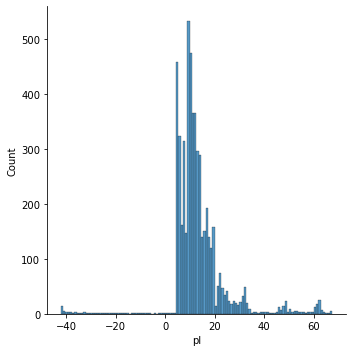

In [ ]:
sns.displot(df_daily[df_daily['papel']=='ENGI4']['pl'])

-	Create a BESST feature
-	Create a feature about the size of the company
Patrim_Liq, Lucro_Liquido_12m, Ativo, Valor_de_mercado, Setor, Subsetor	

In [ ]:
df_tickers[['Setor','Subsetor']].reset_index(drop=True).drop_duplicates()\
    .sort_values(by='Setor').to_csv('../data/01_trusted/Setor-Subsetor.csv')

In [ ]:
def create_numerical_categories(data: pd.DataFrame, cols: list, n: int) -> pd.DataFrame:
    """
    Creates numerical categories for the specified columns based on quantiles.
    
    Args:
        data (pd.DataFrame): The input dataset.
        cols (list): The columns for which numerical categories will be created.
        n (int): The number of quantiles to use for categorization.
        
    Returns:
        pd.DataFrame: The dataset with numerical categories.
    """
    # Iterate over each column
    for col in cols:
        # Create a new column for numerical categories
        data[col + '_category'] = pd.qcut(data[col], q=n, duplicates='drop', labels=list(range(n)))
    
    return data


In [ ]:
# taking out all the tickers that were not active before 2008
df_tickers = df_tickers[~(pd.to_datetime(df_tickers['Data_ult_cot']).dt.year<2008)]

In [ ]:
df_tickers = create_numerical_categories(df_tickers, ['Valor_de_mercado','Lucro_Liquido_12m','Receita_Liquida_12m','Patrim_Liq'], 10)

In [ ]:
# df_tickers[df_tickers['Valor_de_mercado_category']==0].iloc[20:80]

In [ ]:
besst_1 =  [
    'Intermediários Financeiros',
    'Energia Elétrica',
    'Previdência e Seguros',
    'Água e Saneamento',
    'Serviços Financeiros Diversos'
]

besst_2 =  [
    'Mineração',
    'Madeira e Papel',
    'Químicos',
    'Siderurgia e Metalurgia',
    'Petróleo, Gás e Biocombustíveis'
]

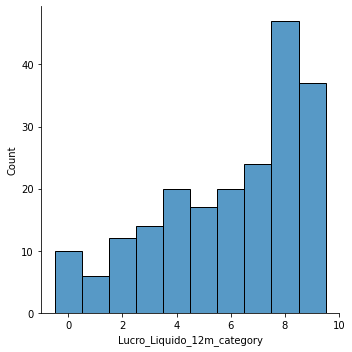

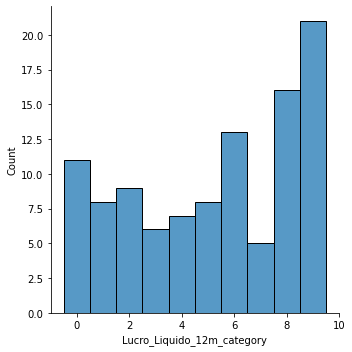

In [ ]:
sns.displot(df_tickers[np.isin(df_tickers['Setor'], besst_1)]['Lucro_Liquido_12m_category'])
sns.displot(df_tickers[np.isin(df_tickers['Setor'], besst_2)]['Lucro_Liquido_12m_category'])

In [ ]:
def create_besst_categories(data: pd.DataFrame, besst_col: str, besst_1: list, besst_2: list) -> pd.DataFrame:
    """
    Creates binary categories based on the values in the specified column.
    
    Args:
        data (pd.DataFrame): The input dataset.
        besst_col (str): The name of the column used for categorization.
        besst_1 (list): Values considered as category 1.
        besst_2 (list): Values considered as category 2.
        
    Returns:
        pd.DataFrame: The dataset with binary categories.
    """
    # Create a new column to indicate if the values are in besst_1
    data['besst_1'] = np.isin(data[besst_col], besst_1)

    # Create a new column to indicate if the values are in besst_2
    data['besst_2'] = np.isin(data[besst_col], besst_2)

    return data


In [ ]:
df_tickers = create_besst_categories(df_tickers, 'Setor', besst_1, besst_2)

In [ ]:
df_tickers['besst_1'].value_counts()

False    617
True     207
Name: besst_1, dtype: int64

In [ ]:
df_tickers['besst_2'].value_counts()

False    720
True     104
Name: besst_2, dtype: int64

In [ ]:
def from_percent_to_numeric(x):
    return np.float(re.sub('%','',x))/100

df_tickers['Div_Yield'] = df_tickers['Div_Yield'].apply(from_percent_to_numeric)

C:\Users\Pontello\AppData\Local\Temp\ipykernel_7028\645260667.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.float(re.sub('%','',x))/100


Selecting just the tickers with the type we want

In [ ]:
df_tickers['Tipo'] = df_tickers['Tipo'].str[:2]
df_tickers = df_tickers.loc[np.isin(df_tickers['Tipo'],['ON','PN'])]

In [ ]:
df_tickers['Papel'].str[-1].value_counts()

3    496
4    205
5     39
6     29
7      5
B      5
1      2
2      2
8      1
Name: Papel, dtype: int64

In [ ]:
df_tickers['Tipo'].value_counts()

ON    501
PN    283
Name: Tipo, dtype: int64

In [ ]:
df_tickers = df_tickers.loc[np.isin(df_tickers['Papel'].str[-1],['3','4','5','6'])]

In [ ]:
# cat_cols = [col for col in df_tickers.columns if '_category' in col]
# list_unequal = []
# for col in cat_cols:
#     for col_2 in cat_cols:
#         list_unequal.append(df_tickers[df_tickers[col].astype(int) - df_tickers[col_2].astype(int) != 0]['Papel'])

In [ ]:
# list_unequal

In [ ]:
df_tickers[[col for col in df_tickers.columns if '_category' in col]]

,Valor_de_mercado_category,Lucro_Liquido_12m_category,Receita_Liquida_12m_category,Patrim_Liq_category
ABCB4,6,8,NaN,7
ABYA3,3,2,2,3
ACES3,7,8,6,7
ACES4,7,8,6,7
ACGU3,0,2,4,1
...,...,...,...,...
CSUD3,3,5,3,3
DMFN3,0,3,NaN,1
ZAMP3,4,1,6,5
VSTE3,5,4,4,4


In [ ]:
# info_papeis = ['Papel','Tipo', 'Empresa', 'Setor', 'Subsetor','Data_ult_cot']
info_tickers = ['Papel','Tipo', 'Empresa', 'Setor', 'Subsetor','Data_ult_cot','Lucro_Liquido_12m_category','Valor_de_mercado_category','Patrim_Liq_category','besst_1','besst_2']
               
df_tickers_clean = df_tickers[info_tickers]

df_tickers_clean = df_tickers_clean.dropna()
df_tickers_clean = df_tickers_clean.drop_duplicates()

In [ ]:
df_tickers_clean['Data_ult_cot'] = pd.to_datetime(df_tickers_clean['Data_ult_cot'])

In [ ]:
df_tickers_clean = df_tickers_clean.reset_index(drop=True)

In [ ]:
# df_completed = df_tickers_clean.merge(df, how='left', left_on='Papel', right_on='papel').drop_duplicates()
df_completed = df_tickers_clean.merge(df_daily, how='left', left_on='Papel', right_on='papel').drop_duplicates()

In [ ]:
df_completed.head()

,Papel,Tipo,Empresa,Setor,Subsetor,Data_ult_cot,Lucro_Liquido_12m_category,Valor_de_mercado_category,Patrim_Liq_category,besst_1,besst_2,days,papel,cotacao,pl,pvp,psr,dy,pa,pcg,pebit,pacl,evebit,mrgebit,mrgliq,roic,roe,liqc,liq2m,patrliq,divbpatr,c5y,date,year
0,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,2008-06-13,ABCB4,9.000000,0.000000,1.100000,0.0,0.048900,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,4.160460e+06,1.107010e+09,0.0,0.000000,2008-06-13,2008.0
1,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,2008-06-14,ABCB4,9.420733,-1.575437,0.992605,0.0,0.082329,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.108924,0.0,4.138828e+06,1.106996e+09,0.0,0.005520,2008-06-14,2008.0
2,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,2008-06-15,ABCB4,9.350419,-1.539819,0.992623,0.0,0.082306,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.108950,0.0,4.116977e+06,1.106984e+09,0.0,0.005535,2008-06-15,2008.0
3,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,2008-06-16,ABCB4,9.280510,-1.504246,0.992641,0.0,0.082284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.108975,0.0,4.094908e+06,1.106973e+09,0.0,0.005549,2008-06-16,2008.0
4,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,2008-06-17,ABCB4,9.211006,-1.468720,0.992659,0.0,0.082262,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.109001,0.0,4.072620e+06,1.106964e+09,0.0,0.005563,2008-06-17,2008.0


In [ ]:
df_completed.isna().sum().sort_values(ascending=False).iloc[:10]

dy          2
pa          2
date        2
c5y         2
divbpatr    2
patrliq     2
liq2m       2
liqc        2
roe         2
roic        2
dtype: int64

In [ ]:
df_completed.dropna(inplace=True)

In [ ]:
df_completed.describe()

,cotacao,pl,pvp,psr,dy,pa,pcg,pebit,pacl,evebit,mrgebit,mrgliq,roic,roe,liqc,liq2m,patrliq,divbpatr,c5y,year
count,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06,2.799390e+06
mean,2.612829e+01,7.306634e+04,9.857786e+03,9.591608e+01,4.836974e-01,8.479381e+02,9.998266e+03,7.258954e+04,9.892902e+03,7.258158e+04,-2.575258e+00,1.213705e+01,2.927560e-01,-3.343850e-01,1.814331e+00,1.031821e+11,5.738434e+09,8.435277e-01,1.590082e-01,2.015881e+03
std,1.442332e+02,6.834816e+06,2.633081e+06,1.120507e+04,1.595364e+01,2.385435e+05,2.636831e+06,6.834396e+06,2.633081e+06,6.849024e+06,9.587224e+01,7.167357e+02,2.026945e+01,9.587095e+01,1.058604e+01,1.765287e+13,2.440063e+10,1.288528e+01,7.885720e+00,4.326385e+00
min,-7.195190e+03,-1.285390e+08,-6.598589e+05,-4.739047e+05,0.000000e+00,-4.687217e+05,-8.141561e+06,-1.285388e+08,-5.727057e+05,-1.288137e+08,-5.710836e+03,-9.152641e+03,-8.944437e+02,-5.472209e+03,-1.280964e+02,-9.573140e+13,-1.309642e+11,-9.712376e+02,-7.406254e+02,2.008000e+03
25%,4.481085e+00,-4.410321e-01,5.200000e-01,1.913189e-01,0.000000e+00,1.610528e-01,-1.767465e-02,0.000000e+00,-1.895317e+00,0.000000e+00,0.000000e+00,-2.754445e-02,0.000000e+00,0.000000e+00,5.561361e-01,7.713689e-04,9.252960e+07,0.000000e+00,-6.551759e-03,2.012000e+03
50%,1.232982e+01,7.214447e+00,1.180000e+00,7.440862e-01,1.106074e-02,4.700000e-01,1.265062e+00,4.435744e+00,-2.318869e-01,6.877986e+00,6.541179e-02,2.312458e-02,4.852267e-02,8.876579e-02,1.270278e+00,1.691012e+04,7.954715e+08,3.222355e-01,6.872400e-02,2.016000e+03
75%,2.787480e+01,1.620356e+01,2.224434e+00,1.726027e+00,4.386412e-02,9.080780e-01,5.279674e+00,1.007786e+01,2.962774e-01,1.416604e+01,1.640000e-01,1.041278e-01,1.154904e-01,1.756199e-01,2.050000e+00,2.316314e+06,2.588856e+09,1.022069e+00,1.334000e-01,2.020000e+03
max,9.740744e+03,7.296197e+08,1.004454e+09,9.099389e+05,1.547888e+03,9.098313e+07,1.004454e+09,7.296189e+08,1.004454e+09,7.311792e+08,3.142613e+03,5.206307e+04,1.750496e+03,5.928227e+03,9.098513e+02,3.656170e+15,4.105450e+11,1.321868e+03,1.872520e+03,2.023000e+03


In [ ]:
client, bucket = initialize_bucket(credentials_path,'storage-barsianize')

path_local = '../data/02_refined/'
filename = 'df_completed_daily.parquet'
blob_name = '03_refined/'

# save the DataFrame as a parquet file
df_completed.to_parquet(path_local + filename)

# upload the parquet file to Google Cloud Storage
blob = bucket.blob(blob_name + filename)
blob._chunk_size = 8388608
blob.upload_from_filename(path_local + filename, num_retries=10, )

## 3 - Data Preparation

In [ ]:
client, bucket = initialize_bucket(credentials_path,'storage-barsianize')

In [ ]:
path = "gs://storage-barsianize/03_refined/df_completed_daily.parquet"
df_completed =  pd.read_parquet(path)

In [ ]:
df_completed.dtypes

Papel                                 object
Tipo                                  object
Empresa                               object
Setor                                 object
Subsetor                              object
Data_ult_cot                  datetime64[ns]
Lucro_Liquido_12m_category             int64
Valor_de_mercado_category              int64
Patrim_Liq_category                    int64
besst_1                                 bool
besst_2                                 bool
days                          datetime64[ns]
papel                                 object
cotacao                              float64
pl                                   float64
pvp                                  float64
psr                                  float64
dy                                   float64
pa                                   float64
pcg                                  float64
pebit                                float64
pacl                                 float64
evebit    

In [ ]:
import pandas as pd


def aggregator_monthly(data: pd.DataFrame, tickers: list, ticker_col: str, date_col: str, agg_dict: dict) -> pd.DataFrame:
    """
    Aggregates data on a monthly basis for the specified tickers using the provided aggregation dictionary.
    
    Args:
        data (pd.DataFrame): The input dataset.
        tickers (list): The list of tickers to aggregate.
        ticker_col (str): The name of the column containing the tickers.
        date_col (str): The name of the column containing the dates.
        agg_dict (dict): The dictionary specifying the aggregations to be performed.
        
    Returns:
        pd.DataFrame: The aggregated data on a monthly basis.
    """
    # Create an empty list to store the monthly aggregated dataframes
    df_agg_monthly_full = []

    # Iterate over each ticker
    for ticker in tickers:
        # Filter the data for the current ticker and perform monthly aggregation
        df_agg_monthly = data.loc[data[ticker_col] == ticker].resample('M', on=date_col).agg(agg_dict)

        # Append the monthly aggregated dataframe to the list
        df_agg_monthly_full.append(df_agg_monthly)

    # Concatenate all the monthly aggregated dataframes
    df_agg_monthly_full = pd.concat(df_agg_monthly_full).reset_index(drop=True)

    # Modify column names to include the original column name and aggregation function (except for 'first' function)
    df_agg_monthly_full.columns = [x[0] + '_' + x[1] if 'first' != x[1] else x[0] for x in df_agg_monthly_full.columns]

    return df_agg_monthly_full


In [ ]:
ticker_col = 'Papel'
date_col = 'date'
tickers = list(df_completed[ticker_col].unique())
agg_dict = {
        'Papel':'first',
        'Tipo':'first',
        'Empresa':'first',
        'Setor':'first',
        'Subsetor':'first',
        'Data_ult_cot':'first',
        'Lucro_Liquido_12m_category':'first',
        'Valor_de_mercado_category':'first',
        'Patrim_Liq_category':'first',
        'besst_1':'first',
        'besst_2':'first',
        'cotacao':['max','min','mean','last'],
        'pl':['max','min','mean','last'],
        'pvp':['max','min','mean','last'],
        'psr':['max','min','mean','last'],
        'dy':['max','min','mean','last','median'],
        'pa':['max','min','mean','last'],
        'pcg':['max','min','mean','last'],
        'pebit':['max','min','mean','last'],
        'pacl':['max','min','mean','last'],
        'evebit':['max','min','mean','last'],
        'mrgebit':['max','min','mean','last'],
        'mrgliq':['max','min','mean','last'],
        'roic':['max','min','mean','last'],
        'roe':['max','min','mean','last'],
        'liqc':['max','min','mean','last'],
        'liq2m':['max','min','mean','last'],
        'patrliq':['max','min','mean','last'],
        'divbpatr':['max','min','mean','last'],
        'c5y':['max','min','mean','last'],
        'date':'last',
        'year':'first'
        }

df_agg_monthly = aggregator_monthly(df_completed, tickers, ticker_col, date_col, agg_dict)

In [ ]:
df_agg_monthly.head()

,Papel,Tipo,Empresa,Setor,Subsetor,Data_ult_cot,Lucro_Liquido_12m_category,Valor_de_mercado_category,Patrim_Liq_category,besst_1,besst_2,cotacao_max,cotacao_min,cotacao_mean,cotacao_last,pl_max,pl_min,pl_mean,pl_last,pvp_max,pvp_min,pvp_mean,pvp_last,psr_max,psr_min,psr_mean,psr_last,dy_max,dy_min,dy_mean,dy_last,dy_median,pa_max,pa_min,pa_mean,pa_last,pcg_max,pcg_min,pcg_mean,pcg_last,pebit_max,pebit_min,pebit_mean,pebit_last,pacl_max,pacl_min,pacl_mean,pacl_last,evebit_max,evebit_min,evebit_mean,evebit_last,mrgebit_max,mrgebit_min,mrgebit_mean,mrgebit_last,mrgliq_max,mrgliq_min,mrgliq_mean,mrgliq_last,roic_max,roic_min,roic_mean,roic_last,roe_max,roe_min,roe_mean,roe_last,liqc_max,liqc_min,liqc_mean,liqc_last,liq2m_max,liq2m_min,liq2m_mean,liq2m_last,patrliq_max,patrliq_min,patrliq_mean,patrliq_last,divbpatr_max,divbpatr_min,divbpatr_mean,divbpatr_last,c5y_max,c5y_min,c5y_mean,c5y_last,date_last,year
0,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,9.420733,8.344365,8.881414,8.344365,0.000000,-1.575437,-1.220533,-1.011058,1.100000,0.992605,0.998706,0.992890,0.0,0.0,0.0,0.0,0.082329,0.048900,0.080305,0.081976,0.082141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.109332,0.000000,0.103066,0.109332,0.0,0.0,0.0,0.0,4.160460e+06,3.762985e+06,3.966677e+06,3.762985e+06,1.107010e+09,1.106940e+09,1.106962e+09,1.106984e+09,0.0,0.0,0.0,0.0,0.005751,0.000000,0.005322,0.005751,2008-06-30,2008.0
1,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,8.930000,6.554353,7.411039,6.554353,0.048980,-0.976174,-0.429903,0.048980,1.090000,0.992908,0.996303,0.993433,0.0,0.0,0.0,0.0,0.081954,0.049300,0.080574,0.081300,0.081604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110113,0.000000,0.106207,0.110113,0.0,0.0,0.0,0.0,3.737637e+06,2.875544e+06,3.322438e+06,2.875544e+06,1.108088e+09,1.106996e+09,1.107430e+09,1.108088e+09,0.0,0.0,0.0,0.0,0.006203,0.000000,0.005797,0.006203,2008-07-31,2008.0
2,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,6.503100,5.154084,5.799189,5.154084,1.064896,0.082440,0.576997,1.064896,0.993964,0.993451,0.993708,0.993964,0.0,0.0,0.0,0.0,0.081278,0.080631,0.080954,0.080631,0.080954,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110884,0.110138,0.110512,0.110884,0.0,0.0,0.0,0.0,2.843419e+06,1.788165e+06,2.327293e+06,1.788165e+06,1.110794e+09,1.108148e+09,1.109310e+09,1.110794e+09,0.0,0.0,0.0,0.0,0.006664,0.006218,0.006440,0.006664,2008-08-31,2008.0
3,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,5.115403,4.170072,4.615295,4.170072,2.006032,1.096933,1.554589,2.006032,0.994465,0.993981,0.994223,0.994465,0.0,0.0,0.0,0.0,0.080610,0.079991,0.080300,0.079991,0.080300,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111620,0.110909,0.111265,0.111620,0.0,0.0,0.0,0.0,1.753722e+06,1.012372e+06,1.342992e+06,1.012372e+06,1.120192e+09,1.110953e+09,1.114850e+09,1.120192e+09,0.0,0.0,0.0,0.0,0.007117,0.006679,0.006897,0.007117,2008-09-30,2008.0
4,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,4.143558,3.200000,3.794062,3.536717,3.220000,2.036691,2.508900,2.935129,0.994969,0.380000,0.974894,0.994969,0.0,0.0,0.0,0.0,0.215600,0.079338,0.084041,0.079338,0.079674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.119000,0.111645,0.112231,0.112371,0.0,0.0,0.0,0.0,9.956878e+05,7.688541e+05,8.401325e+05,7.704102e+05,1.139988e+09,1.120670e+09,1.129556e+09,1.139988e+09,0.0,0.0,0.0,0.0,0.007593,0.000000,0.007123,0.007593,2008-10-31,2008.0


In [ ]:
import requests
import pandas as pd

def correct_data_column(x: str) -> str:
    """
    Corrects the format of a date string from 'DD/MM/YYYY' to 'YYYY-MM-DD'.
    
    Args:
        x (str): The date string in 'DD/MM/YYYY' format.
        
    Returns:
        str: The date string in 'YYYY-MM-DD' format.
    """
    # Split the date string into day, month, and year
    date = x.split('/')

    # Rearrange the date components and join them with '-' separator
    new_date = '-'.join(date[::-1])

    return new_date



def get_bcb_data(codes, start_date, end_date, output_format='json'):
    """
    Get macroeconomic data from the Brazilian Central Bank's API.

    Args:
        codes (list): List of series codes to retrieve. See the API documentation for available codes.
        start_date (str): Start date in format 'dd/mm/yyyy'.
        end_date (str): End date in format 'dd/mm/yyyy'.
        output_format (str, optional): Output format, either 'json' or 'csv'. Defaults to 'json'.

    Returns:
        pandas.DataFrame: DataFrame with the requested series data.

    Raises:
        ValueError: If the output format is invalid.
        requests.exceptions.RequestException: If the API request fails.

    Example:
        Get the values of the crude oil production, commodities, dollar, euro, IPCA, IGPM, and Selic series from January 1st, 2021 to December 31st, 2021 in JSON format:

        >>> codes = [13522, 13521, 4390, 189, 11, 1178]
        >>> start_date = '01/01/2021'
        >>> end_date = '31/12/2021'
        >>> output_format = 'json'
        >>> df = get_bcb_data(codes, start_date, end_date, output_format)

    """
    # Define the base URL of the API
    url_base = "https://api.bcb.gov.br/dados/serie/bcdata.sgs.{}/dados"

    # Define the output format parameter
    if output_format not in ['json', 'csv']:
        raise ValueError("Invalid output format. Must be 'json' or 'csv'.")
    formato = output_format

    # Create a dictionary to store the series DataFrames
    dataframes = {}

    # Get the data for each series and store it in a DataFrame
    for code_name, code in codes.items():
        # Build the complete URL with the defined parameters
        url = url_base.format(code) + f"?formato={formato}&dataInicial={start_date}&dataFinal={end_date}"
        # Make the API request
        response = requests.get(url)
        # Check if the request was successful
        if response.status_code == 200:
            # Convert the response to a pandas DataFrame and set the column name to the series code
            try:
                df = pd.read_json(response.text)
            except:
                try:
                    df = pd.read_xml(response.text)
                except:
                    continue
            col_name = code_name
            df = df.rename(columns={"valor": col_name})
            # Set the DataFrame index to the date
            df = df.set_index("data")
            # Store the DataFrame in the dictionary
            dataframes[col_name] = df[col_name]
        else:
            raise requests.exceptions.RequestException(f"Error getting data. HTTP status code: {response.status_code}")

    # Combine the DataFrames for each series into a single DataFrame
    final_df = pd.concat(dataframes.values(), axis=1).reset_index()

    return final_df

In [ ]:
# https://www3.bcb.gov.br/sgspub/localizarseries/localizarSeries.do?method=prepararTelaLocalizarSeries

codes = {
    'preco_do_petroleo': 4390,
    'preco_do_minerio_de_ferro': 25521,
    'indice_da_industria': 24369,
    'indice_do_agro': 24368,
    'dolar_comercial': 1,
    'euro': 21619,
    'ibovespa': 23686,
    'pib': 21920,
    'pib_dolarizado': 22786,
    'igpm': 189,
    'ipca': 433,
    'selic': 11
}
start_date = "01/01/2008"
end_date = "28/02/2023"
output_format='json'

df_bcb = get_bcb_data(codes, start_date, end_date, output_format=output_format)

In [ ]:
df_bcb['data'] = pd.to_datetime(df_bcb['data'].apply(correct_data_column))

In [ ]:
df_bcb = df_bcb.fillna(method='ffill').fillna(method='bfill')

agg_dict = {
        'data':'first',
        # 'preco_do_petroleo':'last',
        'indice_da_industria':'last',
        'dolar_comercial':'last',
        'euro':'last',
        'ibovespa':'last',
        'pib_dolarizado':'last',
        'igpm':'last',
        'ipca':'last',
        'selic':'last',
        }
df_bcb_agg = df_bcb.resample('M', on='data').agg(agg_dict)
df_bcb_agg = df_bcb_agg.reset_index(drop=True)

In [ ]:
df_bcb_agg

,data,indice_da_industria,dolar_comercial,euro,ibovespa,pib_dolarizado,igpm,ipca,selic
0,2007-12-31,8.6,1.7713,2.60859,240413.5,1544.9,-0.06,0.84,0.042065
1,2008-01-01,8.6,1.7603,2.61510,240413.5,1544.9,-0.06,0.84,0.042065
2,2008-02-01,8.6,1.6833,2.55685,240413.5,771.3,0.53,0.49,0.042065
3,2008-03-01,8.6,1.7491,2.76060,240413.5,771.3,0.53,0.49,0.042065
4,2008-04-01,8.6,1.6872,2.63527,240413.5,1005.5,0.69,0.55,0.043597
...,...,...,...,...,...,...,...,...,...
178,2022-10-01,8.6,5.2570,5.19760,240413.5,1365.7,-0.06,0.45,0.050788
179,2022-11-01,8.6,5.2941,5.45290,240413.5,1365.7,-0.06,0.45,0.050788
180,2022-12-01,8.6,5.2177,5.56940,240413.5,1365.7,-0.06,0.45,0.050788
181,2023-01-01,8.6,5.0993,5.53890,240413.5,1365.7,-0.06,0.45,0.050788


In [ ]:
df_bcb_agg['month'] = df_bcb_agg['data'].dt.month
df_bcb_agg['year'] = df_bcb_agg['data'].dt.year

df_agg_monthly['month'] = df_agg_monthly['date_last'].dt.month

In [ ]:
df_monthly_full = df_agg_monthly.merge(df_bcb_agg, how='left', left_on=['month','year'], right_on=['month','year'])

In [ ]:
client, bucket = initialize_bucket(credentials_path,'storage-barsianize')

path_local = '../data/02_refined/'
filename = 'df_monthly_full.parquet'
blob_name = '03_refined/'

# save the DataFrame as a parquet file
df_monthly_full.to_parquet(path_local + filename)

# upload the parquet file to Google Cloud Storage
blob = bucket.blob(blob_name + filename)
blob._chunk_size = 8388608
blob.upload_from_filename(path_local + filename, num_retries=10, )

### Create windowed dataset

In [ ]:
df_monthly_full.head()

,Papel,Tipo,Empresa,Setor,Subsetor,Data_ult_cot,Lucro_Liquido_12m_category,Valor_de_mercado_category,Patrim_Liq_category,besst_1,besst_2,cotacao_max,cotacao_min,cotacao_mean,cotacao_last,pl_max,pl_min,pl_mean,pl_last,pvp_max,pvp_min,pvp_mean,pvp_last,psr_max,psr_min,psr_mean,psr_last,dy_max,dy_min,dy_mean,dy_last,dy_median,pa_max,pa_min,pa_mean,pa_last,pcg_max,pcg_min,pcg_mean,pcg_last,pebit_max,pebit_min,pebit_mean,pebit_last,pacl_max,pacl_min,pacl_mean,pacl_last,evebit_max,evebit_min,evebit_mean,evebit_last,mrgebit_max,mrgebit_min,mrgebit_mean,mrgebit_last,mrgliq_max,mrgliq_min,mrgliq_mean,mrgliq_last,roic_max,roic_min,roic_mean,roic_last,roe_max,roe_min,roe_mean,roe_last,liqc_max,liqc_min,liqc_mean,liqc_last,liq2m_max,liq2m_min,liq2m_mean,liq2m_last,patrliq_max,patrliq_min,patrliq_mean,patrliq_last,divbpatr_max,divbpatr_min,divbpatr_mean,divbpatr_last,c5y_max,c5y_min,c5y_mean,c5y_last,date_last,year,month,data,indice_da_industria,dolar_comercial,euro,ibovespa,pib_dolarizado,igpm,ipca,selic
0,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,9.420733,8.344365,8.881414,8.344365,0.000000,-1.575437,-1.220533,-1.011058,1.100000,0.992605,0.998706,0.992890,0.0,0.0,0.0,0.0,0.082329,0.048900,0.080305,0.081976,0.082141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.109332,0.000000,0.103066,0.109332,0.0,0.0,0.0,0.0,4.160460e+06,3.762985e+06,3.966677e+06,3.762985e+06,1.107010e+09,1.106940e+09,1.106962e+09,1.106984e+09,0.0,0.0,0.0,0.0,0.005751,0.000000,0.005322,0.005751,2008-06-30,2008.0,6,2008-06-01,8.6,1.5919,2.50629,240413.5,1005.5,0.69,0.55,0.045584
1,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,8.930000,6.554353,7.411039,6.554353,0.048980,-0.976174,-0.429903,0.048980,1.090000,0.992908,0.996303,0.993433,0.0,0.0,0.0,0.0,0.081954,0.049300,0.080574,0.081300,0.081604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110113,0.000000,0.106207,0.110113,0.0,0.0,0.0,0.0,3.737637e+06,2.875544e+06,3.322438e+06,2.875544e+06,1.108088e+09,1.106996e+09,1.107430e+09,1.108088e+09,0.0,0.0,0.0,0.0,0.006203,0.000000,0.005797,0.006203,2008-07-31,2008.0,7,2008-07-01,8.6,1.5666,2.44388,240413.5,1350.1,1.76,0.53,0.048230
2,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,6.503100,5.154084,5.799189,5.154084,1.064896,0.082440,0.576997,1.064896,0.993964,0.993451,0.993708,0.993964,0.0,0.0,0.0,0.0,0.081278,0.080631,0.080954,0.080631,0.080954,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110884,0.110138,0.110512,0.110884,0.0,0.0,0.0,0.0,2.843419e+06,1.788165e+06,2.327293e+06,1.788165e+06,1.110794e+09,1.108148e+09,1.109310e+09,1.110794e+09,0.0,0.0,0.0,0.0,0.006664,0.006218,0.006440,0.006664,2008-08-31,2008.0,8,2008-08-01,8.6,1.6344,2.39848,240413.5,1085.7,-0.32,0.28,0.048230
3,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,5.115403,4.170072,4.615295,4.170072,2.006032,1.096933,1.554589,2.006032,0.994465,0.993981,0.994223,0.994465,0.0,0.0,0.0,0.0,0.080610,0.079991,0.080300,0.079991,0.080300,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111620,0.110909,0.111265,0.111620,0.0,0.0,0.0,0.0,1.753722e+06,1.012372e+06,1.342992e+06,1.012372e+06,1.120192e+09,1.110953e+09,1.114850e+09,1.120192e+09,0.0,0.0,0.0,0.0,0.007117,0.006679,0.006897,0.007117,2008-09-30,2008.0,9,2008-09-01,8.6,1.9143,2.69309,240413.5,1150.3,0.11,0.26,0.050823
4,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,4.143558,3.200000,3.794062,3.536717,3.220000,2.036691,2.508900,2.935129,0.994969,0.380000,0.974894,0.994969,0.0,0.0,0.0,0.0,0.215600,0.079338,0.084041,0.079338,0.079674,0.0,0.0

In [ ]:
agg_dict = {
    'cotacao_max':'max',	
    'cotacao_min':'min',
    'cotacao_mean':['mean','std'],
    'pl_max':'max',
    'pl_min':'min',
    'pl_mean':['mean','std'],
    'pvp_max':'max',
    'pvp_min':'min',
    'pvp_mean':['mean','std'],
    'psr_max':'max',
    'psr_min':'min',
    'psr_mean':['mean','std'],
    'dy_max':'max',
    'dy_min':'min',
    'dy_median':['max','min'],
    'dy_mean':['mean','std'],
    'pa_max':'max',
    'pa_min':'min',
    'pa_mean':['mean','std'],
    'pcg_max':'max',
    'pcg_min':'min',
    'pcg_mean':['mean','std'],
    'pebit_max':'max',
    'pebit_min':'min',
    'pebit_mean':['mean','std'],
    'pacl_max':'max',
    'pacl_min':'min',
    'pacl_mean':['mean','std'],
    'evebit_max':'max',
    'evebit_min':'min',
    'evebit_mean':['mean','std'],
    'mrgebit_max':'max',
    'mrgebit_min':'min',
    'mrgebit_mean':['mean','std'],
    'mrgliq_max':'max',
    'mrgliq_min':'min',
    'mrgliq_mean':['mean','std'],
    'roic_max':'max',
    'roic_min':'min',
    'roic_mean':['mean','std'],
    'roe_max':'max',
    'roe_min':'min',
    'roe_mean':['mean','std'],
    'liqc_max':'max',
    'liqc_min':'min',
    'liqc_mean':['mean','std'],
    'liq2m_max':'max',
    'liq2m_min':'min',
    'liq2m_mean':['mean','std'],
    'patrliq_max':'max',
    'patrliq_min':'min',
    'patrliq_mean':['mean','std'],
    'divbpatr_max':'max',
    'divbpatr_min':'min',
    'divbpatr_mean':['mean','std'],
    'c5y_max':'max',
    'c5y_min':'min',
    'c5y_mean':['mean','std'],
    # 'preco_do_petroleo':['min','max','mean','std'],
    'indice_da_industria':['min','max','mean','std'],
    'dolar_comercial':['min','max','mean','std'],
    'euro':['min','max','mean','std'],
    'ibovespa':['min','max','mean','std'],
    'pib_dolarizado':['min','max','mean','std'],
    'igpm':['min','max','mean','std'],
    'ipca':['min','max','mean','std'],
    'selic':['min','max','mean','std'],
}

agg_dict_ref = {
    'cotacao_max_ref':'max',	
    'cotacao_min_ref':'min',
    'cotacao_mean_ref':['mean','std'],
    'pl_max_ref':'max',
    'pl_min_ref':'min',
    'pl_mean_ref':['mean','std'],
    'pvp_max_ref':'max',
    'pvp_min_ref':'min',
    'pvp_mean_ref':['mean','std'],
    'psr_max_ref':'max',
    'psr_min_ref':'min',
    'psr_mean_ref':['mean','std'],
    'dy_max_ref':'max',
    'dy_min_ref':'min',
    'dy_median_ref':['max','min'],
    'dy_mean_ref':['mean','std'],
    'pa_max_ref':'max',
    'pa_min_ref':'min',
    'pa_mean_ref':['mean','std'],
    'pcg_max_ref':'max',
    'pcg_min_ref':'min',
    'pcg_mean_ref':['mean','std'],
    'pebit_max_ref':'max',
    'pebit_min_ref':'min',
    'pebit_mean_ref':['mean','std'],
    'pacl_max_ref':'max',
    'pacl_min_ref':'min',
    'pacl_mean_ref':['mean','std'],
    'evebit_max_ref':'max',
    'evebit_min_ref':'min',
    'evebit_mean_ref':['mean','std'],
    'mrgebit_max_ref':'max',
    'mrgebit_min_ref':'min',
    'mrgebit_mean_ref':['mean','std'],
    'mrgliq_max_ref':'max',
    'mrgliq_min_ref':'min',
    'mrgliq_mean_ref':['mean','std'],
    'roic_max_ref':'max',
    'roic_min_ref':'min',
    'roic_mean_ref':['mean','std'],
    'roe_max_ref':'max',
    'roe_min_ref':'min',
    'roe_mean_ref':['mean','std'],
    'liqc_max_ref':'max',
    'liqc_min_ref':'min',
    'liqc_mean_ref':['mean','std'],
    'liq2m_max_ref':'max',
    'liq2m_min_ref':'min',
    'liq2m_mean_ref':['mean','std'],
    'patrliq_max_ref':'max',
    'patrliq_min_ref':'min',
    'patrliq_mean_ref':['mean','std'],
    'divbpatr_max_ref':'max',
    'divbpatr_min_ref':'min',
    'divbpatr_mean_ref':['mean','std'],
    'c5y_max_ref':'max',
    'c5y_min_ref':'min',
    'c5y_mean_ref':['mean','std'],
}

columns_to_first = [
    'Papel',
    'Tipo',
    'Empresa',
    'Setor',
    'Subsetor',
    'Data_ult_cot',
    'Lucro_Liquido_12m_category',
    'Valor_de_mercado_category',
    'Patrim_Liq_category',
    'besst_1',
    'besst_2',
]

columns_to_last = [
    'year',
    'date_last',
    'month',
    # 'preco_do_petroleo',
    'indice_da_industria',
    'dolar_comercial',
    'euro',
    'ibovespa',
    'pib_dolarizado',
    'igpm',
    'ipca',
    'selic',
    'cotacao_mean',
    'c5y_mean',
    'pl_mean',
    'pvp_mean',
    'psr_mean',
    'dy_mean',
    'dy_median',
    'pa_mean',
    'pcg_mean',
    'pebit_mean',
    'pacl_mean',
    'evebit_mean',
    'mrgebit_mean',
    'mrgliq_mean',
    'roic_mean',
    'roe_mean',
    'liqc_mean',
    'liq2m_mean',
    'patrliq_mean',
    'divbpatr_mean',
]


    
    

In [ ]:
df_monthly_full.loc[df_monthly_full['Papel']=='ABCB4'].head()

,Papel,Tipo,Empresa,Setor,Subsetor,Data_ult_cot,Lucro_Liquido_12m_category,Valor_de_mercado_category,Patrim_Liq_category,besst_1,besst_2,cotacao_max,cotacao_min,cotacao_mean,cotacao_last,pl_max,pl_min,pl_mean,pl_last,pvp_max,pvp_min,pvp_mean,pvp_last,psr_max,psr_min,psr_mean,psr_last,dy_max,dy_min,dy_mean,dy_last,dy_median,pa_max,pa_min,pa_mean,pa_last,pcg_max,pcg_min,pcg_mean,pcg_last,pebit_max,pebit_min,pebit_mean,pebit_last,pacl_max,pacl_min,pacl_mean,pacl_last,evebit_max,evebit_min,evebit_mean,evebit_last,mrgebit_max,mrgebit_min,mrgebit_mean,mrgebit_last,mrgliq_max,mrgliq_min,mrgliq_mean,mrgliq_last,roic_max,roic_min,roic_mean,roic_last,roe_max,roe_min,roe_mean,roe_last,liqc_max,liqc_min,liqc_mean,liqc_last,liq2m_max,liq2m_min,liq2m_mean,liq2m_last,patrliq_max,patrliq_min,patrliq_mean,patrliq_last,divbpatr_max,divbpatr_min,divbpatr_mean,divbpatr_last,c5y_max,c5y_min,c5y_mean,c5y_last,date_last,year,month,data,indice_da_industria,dolar_comercial,euro,ibovespa,pib_dolarizado,igpm,ipca,selic
0,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,9.420733,8.344365,8.881414,8.344365,0.000000,-1.575437,-1.220533,-1.011058,1.100000,0.992605,0.998706,0.992890,0.0,0.0,0.0,0.0,0.082329,0.048900,0.080305,0.081976,0.082141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.109332,0.000000,0.103066,0.109332,0.0,0.0,0.0,0.0,4.160460e+06,3.762985e+06,3.966677e+06,3.762985e+06,1.107010e+09,1.106940e+09,1.106962e+09,1.106984e+09,0.0,0.0,0.0,0.0,0.005751,0.000000,0.005322,0.005751,2008-06-30,2008.0,6,2008-06-01,8.6,1.5919,2.50629,240413.5,1005.5,0.69,0.55,0.045584
1,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,8.930000,6.554353,7.411039,6.554353,0.048980,-0.976174,-0.429903,0.048980,1.090000,0.992908,0.996303,0.993433,0.0,0.0,0.0,0.0,0.081954,0.049300,0.080574,0.081300,0.081604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110113,0.000000,0.106207,0.110113,0.0,0.0,0.0,0.0,3.737637e+06,2.875544e+06,3.322438e+06,2.875544e+06,1.108088e+09,1.106996e+09,1.107430e+09,1.108088e+09,0.0,0.0,0.0,0.0,0.006203,0.000000,0.005797,0.006203,2008-07-31,2008.0,7,2008-07-01,8.6,1.5666,2.44388,240413.5,1350.1,1.76,0.53,0.048230
2,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,6.503100,5.154084,5.799189,5.154084,1.064896,0.082440,0.576997,1.064896,0.993964,0.993451,0.993708,0.993964,0.0,0.0,0.0,0.0,0.081278,0.080631,0.080954,0.080631,0.080954,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110884,0.110138,0.110512,0.110884,0.0,0.0,0.0,0.0,2.843419e+06,1.788165e+06,2.327293e+06,1.788165e+06,1.110794e+09,1.108148e+09,1.109310e+09,1.110794e+09,0.0,0.0,0.0,0.0,0.006664,0.006218,0.006440,0.006664,2008-08-31,2008.0,8,2008-08-01,8.6,1.6344,2.39848,240413.5,1085.7,-0.32,0.28,0.048230
3,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,5.115403,4.170072,4.615295,4.170072,2.006032,1.096933,1.554589,2.006032,0.994465,0.993981,0.994223,0.994465,0.0,0.0,0.0,0.0,0.080610,0.079991,0.080300,0.079991,0.080300,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111620,0.110909,0.111265,0.111620,0.0,0.0,0.0,0.0,1.753722e+06,1.012372e+06,1.342992e+06,1.012372e+06,1.120192e+09,1.110953e+09,1.114850e+09,1.120192e+09,0.0,0.0,0.0,0.0,0.007117,0.006679,0.006897,0.007117,2008-09-30,2008.0,9,2008-09-01,8.6,1.9143,2.69309,240413.5,1150.3,0.11,0.26,0.050823
4,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,4.143558,3.200000,3.794062,3.536717,3.220000,2.036691,2.508900,2.935129,0.994969,0.380000,0.974894,0.994969,0.0,0.0,0.0,0.0,0.215600,0.079338,0.084041,0.079338,0.079674,0.0,0.0

In [ ]:
sector_col = 'Setor'
cols_to_ref = [
    'cotacao_max',
    'cotacao_min',
    'cotacao_mean',
    'cotacao_last',
    'pl_max',
    'pl_min',
    'pl_mean',
    'pl_last',
    'pvp_max',
    'pvp_min',
    'pvp_mean',
    'pvp_last',
    'psr_max',
    'psr_min',
    'psr_mean',
    'psr_last',
    'dy_max',
    'dy_min',
    'dy_mean',
    'dy_median',
    'dy_last',
    'pa_max',
    'pa_min',
    'pa_mean',
    'pa_last',
    'pcg_max',
    'pcg_min',
    'pcg_mean',
    'pcg_last',
    'pebit_max',
    'pebit_min',
    'pebit_mean',
    'pebit_last',
    'pacl_max',
    'pacl_min',
    'pacl_mean',
    'pacl_last',
    'evebit_max',
    'evebit_min',
    'evebit_mean',
    'evebit_last',
    'mrgebit_max',
    'mrgebit_min',
    'mrgebit_mean',
    'mrgebit_last',
    'mrgliq_max',
    'mrgliq_min',
    'mrgliq_mean',
    'mrgliq_last',
    'roic_max',
    'roic_min',
    'roic_mean',
    'roic_last',
    'roe_max',
    'roe_min',
    'roe_mean',
    'roe_last',
    'liqc_max',
    'liqc_min',
    'liqc_mean',
    'liqc_last',
    'liq2m_max',
    'liq2m_min',
    'liq2m_mean',
    'liq2m_last',
    'patrliq_max',
    'patrliq_min',
    'patrliq_mean',
    'patrliq_last',
    'divbpatr_max',
    'divbpatr_min',
    'divbpatr_mean',
    'divbpatr_last',
    'c5y_max',
    'c5y_min',
    'c5y_mean',
    'c5y_last'
]

df_monthly_full_ref = df_monthly_full.groupby([sector_col,'year','month']).median()[cols_to_ref]
df_monthly_full_ref.columns = [col+'_ref' for col in df_monthly_full_ref.columns]
df_monthly_full_ref = df_monthly_full_ref.reset_index()

In [ ]:
df_monthly_full_ref.head()

,Setor,year,month,cotacao_max_ref,cotacao_min_ref,cotacao_mean_ref,cotacao_last_ref,pl_max_ref,pl_min_ref,pl_mean_ref,pl_last_ref,pvp_max_ref,pvp_min_ref,pvp_mean_ref,pvp_last_ref,psr_max_ref,psr_min_ref,psr_mean_ref,psr_last_ref,dy_max_ref,dy_min_ref,dy_mean_ref,dy_median_ref,dy_last_ref,pa_max_ref,pa_min_ref,pa_mean_ref,pa_last_ref,pcg_max_ref,pcg_min_ref,pcg_mean_ref,pcg_last_ref,pebit_max_ref,pebit_min_ref,pebit_mean_ref,pebit_last_ref,pacl_max_ref,pacl_min_ref,pacl_mean_ref,pacl_last_ref,evebit_max_ref,evebit_min_ref,evebit_mean_ref,evebit_last_ref,mrgebit_max_ref,mrgebit_min_ref,mrgebit_mean_ref,mrgebit_last_ref,mrgliq_max_ref,mrgliq_min_ref,mrgliq_mean_ref,mrgliq_last_ref,roic_max_ref,roic_min_ref,roic_mean_ref,roic_last_ref,roe_max_ref,roe_min_ref,roe_mean_ref,roe_last_ref,liqc_max_ref,liqc_min_ref,liqc_mean_ref,liqc_last_ref,liq2m_max_ref,liq2m_min_ref,liq2m_mean_ref,liq2m_last_ref,patrliq_max_ref,patrliq_min_ref,patrliq_mean_ref,patrliq_last_ref,divbpatr_max_ref,divbpatr_min_ref,divbpatr_mean_ref,divbpatr_last_ref,c5y_max_ref,c5y_min_ref,c5y_mean_ref,c5y_last_ref
0,Agropecuária,2008.0,6,0.650000,0.531339,0.535132,0.531339,59.09000,54.475012,56.392841,54.475012,2.280000,1.872871,1.918334,1.872871,2.415000,1.868141,1.888836,1.896109,0.017219,0.007400,0.016751,0.017182,0.017219,1.184000,0.997888,1.021542,0.997888,4.080000,3.741977,3.821114,3.741977,17.330000,15.807328,16.506800,15.807328,6.098342,3.255425,3.446971,3.255425,19.933485,18.197095,19.097089,18.197095,0.136615,0.096800,0.129795,0.135482,0.188200,0.107629,0.112415,0.107629,0.069656,0.039000,0.067719,0.069161,0.098000,0.038500,0.069968,0.071725,2.527832,2.180000,2.496094,2.501577,207378.844666,204898.649962,206701.929787,204898.649962,9.026600e+07,9.023761e+07,9.024634e+07,9.025527e+07,0.562209,0.50000,0.514055,0.512682,0.146311,0.027400,0.139131,0.145096
1,Agropecuária,2008.0,7,12.000000,0.500000,10.214486,9.922897,150.16977,47.114520,111.634116,80.348685,2.086628,1.861276,1.883906,1.861276,2.192000,1.832190,1.871555,1.887443,0.017347,0.008100,0.017069,0.017286,0.017347,1.106341,0.986639,1.000132,0.986639,3.734212,3.518529,3.620886,3.518529,18.610719,13.630089,17.681971,16.809652,5.690000,3.157314,3.283448,3.157314,21.179197,15.437781,20.178575,19.235070,0.135411,0.096800,0.129332,0.133266,0.188200,0.106376,0.109582,0.106376,0.069130,0.039000,0.067701,0.068216,0.098000,0.038500,0.070468,0.071365,2.499943,2.180000,2.465299,2.451309,280677.392285,176626.227439,192930.918382,280677.392285,9.070513e+07,9.026032e+07,9.043698e+07,9.070513e+07,0.558002,0.50000,0.524290,0.529132,0.145020,0.027400,0.140091,0.142745
2,Agropecuária,2008.0,8,9.907546,9.474660,9.686792,9.474660,78.80875,56.419877,63.902130,56.419877,1.860904,1.849794,1.855340,1.849794,1.887163,1.878763,1.882964,1.878763,0.017468,0.017351,0.017410,0.017411,0.017468,0.986277,0.975495,0.980878,0.975495,3.511916,3.330801,3.418664,3.330801,16.753670,11.962987,15.955777,11.962987,3.154165,3.060153,3.107087,3.060153,19.174575,13.476472,18.311650,13.476472,0.133194,0.131021,0.132109,0.131021,0.106336,0.105146,0.105740,0.105146,0.068186,0.067292,0.067738,0.067292,0.071353,0.071008,0.071180,0.071008,2.449701,2.401833,2.425708,2.401833,347996.555060,285965.142134,330681.612029,344042.033256,9.174119e+07,9.072974e+07,9.119835e+07,9.174119e+07,0.545435,0.52966,0.537559,0.543104,0.142670,0.140397,0.141533,0.140397
3,Agropecuária,2008.0,9,9.461152,9.095287,9.274196,9.095287,80.11329,56.467221,64.825550,80.113290,1.849425,1.838789,1.844099,1.838789,1.878483,1.870350,1.874418,1.870350,0.017577,0.017472,0.017525,0.017525,0.017577,0.975138,0.964812,0.969967,0.964812,3.325340,3.183139,3.251724,3.183139,11.917703,10.835378,11.340620,10.835378,3.057034,2.967030,3.011966,2.967030,13.426490,12.338239,12.826175,12.338239,0.130948,0.128822,0.129887,0.128822,0.105107,0.103977,0.104540,0.103977,0.067263,0.066418,0.066839,0.066418,0.070997,0.070667,0.070832,0.070667,2.400251,2.354707,2.377423,2.354707,342626.076148,207495.174021,28969

In [ ]:
df_monthly_full_merge =  df_monthly_full.merge(df_monthly_full_ref, how='left', on=['Setor','year','month'])
ref_cols = [col for col in df_monthly_full_merge.columns if '_ref' in col]
val_cols = [col[:-4] for col in ref_cols]

df_monthly_full_merge[ref_cols] = np.divide(df_monthly_full_merge[val_cols],df_monthly_full_merge[ref_cols])

df_monthly_full_merge.fillna(0, inplace=True)

C:\Users\Pontello\AppData\Local\Temp\ipykernel_7028\1698378846.py:5: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the result takes the index/columns of the first DataFrame. In the future , the DataFrames/Series will be aligned before applying the ufunc.
Convert one of the arguments to a NumPy array (eg 'ufunc(df1, np.asarray(df2)') to keep the current behaviour, or align manually (eg 'df1, df2 = df1.align(df2)') before passing to the ufunc to obtain the future behaviour and silence this warning.
  df_monthly_full_merge[ref_cols] = np.divide(df_monthly_full_merge[val_cols],df_monthly_full_merge[ref_cols])


In [ ]:
df_monthly_full_merge.head()

,Papel,Tipo,Empresa,Setor,Subsetor,Data_ult_cot,Lucro_Liquido_12m_category,Valor_de_mercado_category,Patrim_Liq_category,besst_1,besst_2,cotacao_max,cotacao_min,cotacao_mean,cotacao_last,pl_max,pl_min,pl_mean,pl_last,pvp_max,pvp_min,pvp_mean,pvp_last,psr_max,psr_min,psr_mean,psr_last,dy_max,dy_min,dy_mean,dy_last,dy_median,pa_max,pa_min,pa_mean,pa_last,pcg_max,pcg_min,pcg_mean,pcg_last,pebit_max,pebit_min,pebit_mean,pebit_last,pacl_max,pacl_min,pacl_mean,pacl_last,evebit_max,evebit_min,evebit_mean,evebit_last,mrgebit_max,mrgebit_min,mrgebit_mean,mrgebit_last,mrgliq_max,mrgliq_min,mrgliq_mean,mrgliq_last,roic_max,roic_min,roic_mean,roic_last,roe_max,roe_min,roe_mean,roe_last,liqc_max,liqc_min,liqc_mean,liqc_last,liq2m_max,liq2m_min,liq2m_mean,liq2m_last,patrliq_max,patrliq_min,patrliq_mean,patrliq_last,divbpatr_max,divbpatr_min,divbpatr_mean,divbpatr_last,c5y_max,c5y_min,c5y_mean,c5y_last,date_last,year,month,data,indice_da_industria,dolar_comercial,euro,ibovespa,pib_dolarizado,igpm,ipca,selic,cotacao_max_ref,cotacao_min_ref,cotacao_mean_ref,cotacao_last_ref,pl_max_ref,pl_min_ref,pl_mean_ref,pl_last_ref,pvp_max_ref,pvp_min_ref,pvp_mean_ref,pvp_last_ref,psr_max_ref,psr_min_ref,psr_mean_ref,psr_last_ref,dy_max_ref,dy_min_ref,dy_mean_ref,dy_median_ref,dy_last_ref,pa_max_ref,pa_min_ref,pa_mean_ref,pa_last_ref,pcg_max_ref,pcg_min_ref,pcg_mean_ref,pcg_last_ref,pebit_max_ref,pebit_min_ref,pebit_mean_ref,pebit_last_ref,pacl_max_ref,pacl_min_ref,pacl_mean_ref,pacl_last_ref,evebit_max_ref,evebit_min_ref,evebit_mean_ref,evebit_last_ref,mrgebit_max_ref,mrgebit_min_ref,mrgebit_mean_ref,mrgebit_last_ref,mrgliq_max_ref,mrgliq_min_ref,mrgliq_mean_ref,mrgliq_last_ref,roic_max_ref,roic_min_ref,roic_mean_ref,roic_last_ref,roe_max_ref,roe_min_ref,roe_mean_ref,roe_last_ref,liqc_max_ref,liqc_min_ref,liqc_mean_ref,liqc_last_ref,liq2m_max_ref,liq2m_min_ref,liq2m_mean_ref,liq2m_last_ref,patrliq_max_ref,patrliq_min_ref,patrliq_mean_ref,patrliq_last_ref,divbpatr_max_ref,divbpatr_min_ref,divbpatr_mean_ref,divbpatr_last_ref,c5y_max_ref,c5y_min_ref,c5y_mean_ref,c5y_last_ref
0,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,9.420733,8.344365,8.881414,8.344365,0.000000,-1.575437,-1.220533,-1.011058,1.100000,0.992605,0.998706,0.992890,0.0,0.0,0.0,0.0,0.082329,0.048900,0.080305,0.081976,0.082141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.109332,0.000000,0.103066,0.109332,0.0,0.0,0.0,0.0,4.160460e+06,3.762985e+06,3.966677e+06,3.762985e+06,1.107010e+09,1.106940e+09,1.106962e+09,1.106984e+09,0.0,0.0,0.0,0.0,0.005751,0.000000,0.005322,0.005751,2008-06-30,2008.0,6,2008-06-01 00:00:00,8.6,1.5919,2.50629,240413.5,1005.5,0.69,0.55,0.045584,0.915523,1.065766,1.105569,1.054328,0.000000,-0.218210,-0.148495,-0.129756,0.709887,0.919393,0.791146,0.794858,0.0,0.0,0.0,0.0,1.585717,2.303253,1.999461,1.997187,1.995310,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.572776,0.000000,0.670214,0.705018,0.0,0.0,0.0,0.0,17.579576,38.651147,22.289213,16.942582,1.332913,2.143028,1.520351,1.774915,0.0,0.0,0.0,0.0,0.040107,0.000000,0.074840,0.088726
1,ABCB4,PN,ABC Brasil PN N2,Intermediários Financeiros,Bancos,2023-04-24,8,6,7,True,False,8.930000,6.554353,7.411039,6.554353,0.048980,-0.976174,-0.429903,0.048980,1.090000,0.992908,0.996303,0.993433,0.0,0.0,0.0,0.0,0.081954,0.049300,0.080574,0.081300,0.081604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110113,0.000000,0.106207,0.110113,0.0,0.0,0.0,0.0,3.737637e+06,2.875544e+06,3.322438e+06,2.875544e+06,1.108088e+09,1.106996e+09,1.107430e+09,1.108088e+09,0.0,0.0,0.0,0.0,0.006203,0.000000,0.005797,0.006203,2008-07-31,2008.0,7,2008-07-01 00:00:00,8.6,1.5666,2.44388,240413.5,1350.1,1.76,0.53,0.048230,0.911688,0.839933,0.898527,0.811801,0.004791,-0.166940,-0

In [ ]:
import pandas as pd


def get_windowed_data(data: pd.DataFrame, agg_dict: dict, tickers: list, ticker_col: str, columns_to_first: list,
                      columns_to_last: list, agg_dict_ref: dict) -> pd.DataFrame:
    """
    Applies windowed aggregations and shifts to the data for each ticker.
    
    Args:
        data (pd.DataFrame): The input dataset.
        agg_dict (dict): The dictionary specifying the aggregations to be performed.
        tickers (list): The list of tickers.
        ticker_col (str): The name of the column containing the tickers.
        columns_to_first (list): The list of columns to shift using the 'first' value.
        columns_to_last (list): The list of columns to shift using the 'last' value.
        agg_dict_ref (dict): The dictionary specifying the aggregations for the reference window.
        
    Returns:
        pd.DataFrame: The windowed data with aggregations and shifted values.
    """
    # Create an empty list to store the windowed dataframes
    data_windowed_full = []

    # Iterate over each ticker
    for ticker in tickers:
        # Filter the data for the current ticker
        data_ticker = data[data[ticker_col] == ticker]

        # Apply rolling aggregations to the data
        data_windowed = data_ticker.rolling(12).agg(agg_dict)
        data_windowed_ref = data_ticker.rolling(12).agg(agg_dict_ref)

        # Concatenate the rolling aggregations and reference aggregations
        data_windowed = pd.concat([data_windowed, data_windowed_ref], axis=1)

        # Modify column names to include the original column name and aggregation function (except for 'first' function)
        column_suffix = lambda x: x[0] + '_' + x[1] if x[1] != 'first' else x[0]
        data_windowed.columns = [column_suffix(x) for x in data_windowed.columns]

        # Shift selected columns using 'first' and 'last' values
        data_windowed[columns_to_first] = data_ticker[columns_to_first].shift(12)
        data_windowed[[col + '_last' for col in columns_to_last]] = data_ticker[columns_to_last].shift(12)

        # Shift the 'dy_last' column and drop rows with NaN values in 'dy_label'
        data_windowed['dy_label'] = data_ticker['dy_last'].shift(24)
        data_windowed.dropna(subset=['dy_label'], inplace=True)

        # Append the windowed dataframe to the list
        data_windowed_full.append(data_windowed)

    # Concatenate all the windowed dataframes
    data_windowed_full = pd.concat(data_windowed_full)

    # Fill NaN values with backward filling method
    data_windowed_full.fillna(method='bfill', inplace=True)

    return data_windowed_full

    

In [ ]:
df_monthly_full[ticker_col].unique()

array(['ABCB4', 'ABYA3', 'ACES3', 'ACES4', 'AELP3', 'AFLU3', 'AFLU5',
       'AGIN3', 'AGRO3', 'AHEB3', 'AHEB5', 'AHEB6', 'ALLL3', 'ALLL4',
       'ALPA3', 'ALPA4', 'AMIL3', 'AMPI3', 'APTI4', 'ARCZ3', 'ARCZ6',
       'AVIL3', 'AZEV3', 'AZEV4', 'BAHI3', 'BAHI4', 'BALM3', 'BALM4',
       'BAUH4', 'BAZA3', 'BBAS3', 'BBDC3', 'BBDC4', 'BDLL3', 'BDLL4',
       'BEEF3', 'BEES3', 'BEMA3', 'BGIP3', 'BGIP4', 'BICB3', 'BICB4',
       'BIOM3', 'BIOM4', 'BISA3', 'BMEB3', 'BMEB4', 'BMEF3', 'BMIN3',
       'BMIN4', 'BMKS3', 'BNBR3', 'BNBR4', 'BNCA3', 'BOBR3', 'BOBR4',
       'BOVH3', 'BPAR3', 'BPIA3', 'BRAP3', 'BRAP4', 'BRGE3', 'BRGE5',
       'BRGE6', 'BRIV3', 'BRIV4', 'BRKM3', 'BRKM5', 'BRKM6', 'BRML3',
       'BRSR3', 'BRSR5', 'BRSR6', 'BSCT5', 'BSCT6', 'BTTL3', 'BUET3',
       'BUET4', 'CALI3', 'CALI4', 'CAMB3', 'CAMB4', 'CASN3', 'CBEE3',
       'CCHI3', 'CCHI4', 'CCIM3', 'CCRO3', 'CEBR3', 'CEBR5', 'CEBR6',
       'CEDO3', 'CEDO4', 'CEEB3', 'CEEB5', 'CEGR3', 'CEPE3', 'CEPE5',
       'CEPE6', 'CES

In [ ]:
ticker_col = 'Papel'
tickers = df_monthly_full[ticker_col].unique()
agg_dict_ref = agg_dict_ref

df_windowed_full = get_windowed_data(df_monthly_full_merge, agg_dict, tickers, ticker_col,columns_to_first,columns_to_last,agg_dict_ref)

C:\Users\Pontello\AppData\Local\Temp\ipykernel_7028\3152936184.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_windowed[columns_to_first] = data_ticker[columns_to_first].shift(12)
C:\Users\Pontello\AppData\Local\Temp\ipykernel_7028\3152936184.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_windowed[columns_to_first] = data_ticker[columns_to_first].shift(12)
C:\Users\Pontello\AppData\Local\Temp\ipykernel_7028\3152936184.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of c

In [ ]:
df_windowed_full.dropna(inplace=True)
df_windowed_full.drop_duplicates(inplace=True)

#### Calculation of the spread

In [ ]:
max_cols = [col for col in df_windowed_full.columns if '_max' in col]
min_cols = [col for col in df_windowed_full.columns if '_min' in col]
spread_cols = [re.sub('mean_','',re.sub('_min','',re.sub('_max','',col)))+'_spread' for col in max_cols]
print(spread_cols)

df_windowed_full[spread_cols] = np.subtract(df_windowed_full[max_cols],df_windowed_full[min_cols])

spread_relevance_cols = [re.sub('mean_','',re.sub('_min','',re.sub('_max','',col)))+'_spread' for col in max_cols]

['cotacao_spread', 'pl_spread', 'pvp_spread', 'psr_spread', 'dy_spread', 'dy_median_spread', 'pa_spread', 'pcg_spread', 'pebit_spread', 'pacl_spread', 'evebit_spread', 'mrgebit_spread', 'mrgliq_spread', 'roic_spread', 'roe_spread', 'liqc_spread', 'liq2m_spread', 'patrliq_spread', 'divbpatr_spread', 'c5y_spread', 'preco_do_petroleo_spread', 'indice_da_industria_spread', 'dolar_comercial_spread', 'euro_spread', 'ibovespa_spread', 'pib_dolarizado_spread', 'igpm_spread', 'ipca_spread', 'selic_spread', 'cotacao_ref_spread', 'pl_ref_spread', 'pvp_ref_spread', 'psr_ref_spread', 'dy_ref_spread', 'dy_median_ref_spread', 'pa_ref_spread', 'pcg_ref_spread', 'pebit_ref_spread', 'pacl_ref_spread', 'evebit_ref_spread', 'mrgebit_ref_spread', 'mrgliq_ref_spread', 'roic_ref_spread', 'roe_ref_spread', 'liqc_ref_spread', 'liq2m_ref_spread', 'patrliq_ref_spread', 'divbpatr_ref_spread', 'c5y_ref_spread']


C:\Users\Pontello\AppData\Local\Temp\ipykernel_3224\2429617848.py:6: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the result takes the index/columns of the first DataFrame. In the future , the DataFrames/Series will be aligned before applying the ufunc.
Convert one of the arguments to a NumPy array (eg 'ufunc(df1, np.asarray(df2)') to keep the current behaviour, or align manually (eg 'df1, df2 = df1.align(df2)') before passing to the ufunc to obtain the future behaviour and silence this warning.
  df_windowed_full[spread_cols] = np.subtract(df_windowed_full[max_cols],df_windowed_full[min_cols])


In [ ]:
last_cols = [col for col in df_windowed_full.columns if '_last' in col]

spread_cols_clean = [re.sub('_spread','',col) for col in spread_cols]
last_cols_clean = [re.sub('_mean','',re.sub('_last','',col)) for col in df_windowed_full.columns if '_last' in col]

spread_cols = np.array(spread_cols)
last_cols = np.array(last_cols)

spread_relevance_cols_spread = sorted(spread_cols[np.isin(spread_cols_clean,last_cols_clean)])
spread_relevance_cols_last   = sorted(last_cols[np.isin(last_cols_clean,spread_cols_clean)])

spread_relevance_cols = [col + '_relevance' for col in spread_relevance_cols_spread]

df_windowed_full[spread_relevance_cols] = np.divide(df_windowed_full[spread_relevance_cols_spread],df_windowed_full[spread_relevance_cols_last]).fillna(0)

C:\Users\Pontello\AppData\Local\Temp\ipykernel_3224\4243732791.py:14: FutureWarning: Calling a ufunc on non-aligned DataFrames (or DataFrame/Series combination). Currently, the indices are ignored and the result takes the index/columns of the first DataFrame. In the future , the DataFrames/Series will be aligned before applying the ufunc.
Convert one of the arguments to a NumPy array (eg 'ufunc(df1, np.asarray(df2)') to keep the current behaviour, or align manually (eg 'df1, df2 = df1.align(df2)') before passing to the ufunc to obtain the future behaviour and silence this warning.
  df_windowed_full[spread_relevance_cols] = np.divide(df_windowed_full[spread_relevance_cols_spread],df_windowed_full[spread_relevance_cols_last]).fillna(0)


In [ ]:
df_windowed_full[df_windowed_full['Papel']=='BBAS3'].head()

,cotacao_max_max,cotacao_min_min,cotacao_mean_mean,cotacao_mean_std,pl_max_max,pl_min_min,pl_mean_mean,pl_mean_std,pvp_max_max,pvp_min_min,pvp_mean_mean,pvp_mean_std,psr_max_max,psr_min_min,psr_mean_mean,psr_mean_std,dy_max_max,dy_min_min,dy_median_max,dy_median_min,dy_mean_mean,dy_mean_std,pa_max_max,pa_min_min,pa_mean_mean,pa_mean_std,pcg_max_max,pcg_min_min,pcg_mean_mean,pcg_mean_std,pebit_max_max,pebit_min_min,pebit_mean_mean,pebit_mean_std,pacl_max_max,pacl_min_min,pacl_mean_mean,pacl_mean_std,evebit_max_max,evebit_min_min,evebit_mean_mean,evebit_mean_std,mrgebit_max_max,mrgebit_min_min,mrgebit_mean_mean,mrgebit_mean_std,mrgliq_max_max,mrgliq_min_min,mrgliq_mean_mean,mrgliq_mean_std,roic_max_max,roic_min_min,roic_mean_mean,roic_mean_std,roe_max_max,roe_min_min,roe_mean_mean,roe_mean_std,liqc_max_max,liqc_min_min,liqc_mean_mean,liqc_mean_std,liq2m_max_max,liq2m_min_min,liq2m_mean_mean,liq2m_mean_std,patrliq_max_max,patrliq_min_min,patrliq_mean_mean,patrliq_mean_std,divbpatr_max_max,divbpatr_min_min,divbpatr_mean_mean,divbpatr_mean_std,c5y_max_max,c5y_min_min,c5y_mean_mean,c5y_mean_std,preco_do_petroleo_min,preco_do_petroleo_max,preco_do_petroleo_mean,preco_do_petroleo_std,indice_da_industria_min,indice_da_industria_max,indice_da_industria_mean,indice_da_industria_std,dolar_comercial_min,dolar_comercial_max,dolar_comercial_mean,dolar_comercial_std,euro_min,euro_max,euro_mean,euro_std,ibovespa_min,ibovespa_max,ibovespa_mean,ibovespa_std,pib_dolarizado_min,pib_dolarizado_max,...,selic_last,cotacao_mean_last,c5y_mean_last,pl_mean_last,pvp_mean_last,psr_mean_last,dy_mean_last,dy_median_last,pa_mean_last,pcg_mean_last,pebit_mean_last,pacl_mean_last,evebit_mean_last,mrgebit_mean_last,mrgliq_mean_last,roic_mean_last,roe_mean_last,liqc_mean_last,liq2m_mean_last,patrliq_mean_last,divbpatr_mean_last,dy_label,cotacao_spread,pl_spread,pvp_spread,psr_spread,dy_spread,dy_median_spread,pa_spread,pcg_spread,pebit_spread,pacl_spread,evebit_spread,mrgebit_spread,mrgliq_spread,roic_spread,roe_spread,liqc_spread,liq2m_spread,patrliq_spread,divbpatr_spread,c5y_spread,preco_do_petroleo_spread,indice_da_industria_spread,dolar_comercial_spread,euro_spread,ibovespa_spread,pib_dolarizado_spread,igpm_spread,ipca_spread,selic_spread,cotacao_ref_spread,pl_ref_spread,pvp_ref_spread,psr_ref_spread,dy_ref_spread,dy_median_ref_spread,pa_ref_spread,pcg_ref_spread,pebit_ref_spread,pacl_ref_spread,evebit_ref_spread,mrgebit_ref_spread,mrgliq_ref_spread,roic_ref_spread,roe_ref_spread,liqc_ref_spread,liq2m_ref_spread,patrliq_ref_spread,divbpatr_ref_spread,c5y_ref_spread,c5y_spread_relevance,cotacao_spread_relevance,divbpatr_spread_relevance,dolar_comercial_spread_relevance,dy_median_spread_relevance,dy_spread_relevance,euro_spread_relevance,evebit_spread_relevance,ibovespa_spread_relevance,igpm_spread_relevance,indice_da_industria_spread_relevance,ipca_spread_relevance,liq2m_spread_relevance,liqc_spread_relevance,mrgebit_spread_relevance,mrgliq_spread_relevance,pa_spread_relevance,pacl_spread_relevance,patrliq_spread_relevance,pcg_spread_relevance,pebit_spread_relevance,pib_dolarizado_spread_relevance,pl_spread_relevance,preco_do_petroleo_spread_relevance,psr_spread_relevance,pvp_spread_relevance,roe_spread_relevance,roic_spread_relevance,selic_spread_relevance
5394,31.165066,21.344317,28.908778,3.045050,8.910000,6.293639,7.880729,0.822626,2.37,1.535585,1.637004,0.059312,0.0,0.0,0.0,0.0,0.077598,0.0455,0.077512,0.075651,0.075815,0.000960,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.279184,0.254875,0.266722,0.007210,0.0,0.0,0.0,0.0,1.407466e+08,5.285745e+07,9.229158e+07,2.568230e+07,3.604036e+10,3.079931e+10,3.347955e+10,1.135393e+09,0.0,0.0,0.0,0.0,0.157837,0.0669,0.140389,0.008325,0.92,0.92,0.92,0.0,8.6,8.6,8.6,0.0,1.7306,1.8864,1.799033,0.055122,2.2043,2.70100,2.491633,0.169400,240413.5,240413.5,240413.5,0.0,1544.9,1544.9,...,0.034786,20.449466,0.159210,6.182108,1.719819,0.0,0

### Storing refined data into Google Cloud

In [ ]:
client, bucket = initialize_bucket(credentials_path,'storage-barsianize')

path_local = '../data/02_refined/'
filename = 'df_monthly_full_ref.parquet'
blob_name = '03_refined/'

# save the DataFrame as a parquet file
df_monthly_full_ref.to_parquet(path_local + filename)

# upload the parquet file to Google Cloud Storage
blob = bucket.blob(blob_name + filename)
blob._chunk_size = 8388608
blob.upload_from_filename(path_local + filename, num_retries=10, )




path_local = '../data/02_refined/'
filename = 'df_monthly_full_merge.parquet'
blob_name = '03_refined/'

# save the DataFrame as a parquet file
df_monthly_full_merge.to_parquet(path_local + filename)

# upload the parquet file to Google Cloud Storage
blob = bucket.blob(blob_name + filename)
blob._chunk_size = 8388608
blob.upload_from_filename(path_local + filename, num_retries=10, )





path_local = '../data/02_refined/'
filename = 'df_windowed_full.parquet'
blob_name = '03_refined/'

# save the DataFrame as a parquet file
df_windowed_full.to_parquet(path_local + filename)

# upload the parquet file to Google Cloud Storage
blob = bucket.blob(blob_name + filename)
blob._chunk_size = 8388608
blob.upload_from_filename(path_local + filename, num_retries=10, )

In [ ]:
client, bucket = initialize_bucket(credentials_path,'storage-barsianize')

path = "gs://storage-barsianize/03_refined/df_windowed_full.parquet"
df_windowed_full =  pd.read_parquet(path)

In [ ]:
df_windowed_full.describe()

,cotacao_max_max,cotacao_min_min,cotacao_mean_mean,cotacao_mean_std,pl_max_max,pl_min_min,pl_mean_mean,pl_mean_std,pvp_max_max,pvp_min_min,pvp_mean_mean,pvp_mean_std,psr_max_max,psr_min_min,psr_mean_mean,psr_mean_std,dy_max_max,dy_min_min,dy_median_max,dy_median_min,dy_mean_mean,dy_mean_std,pa_max_max,pa_min_min,pa_mean_mean,pa_mean_std,pcg_max_max,pcg_min_min,pcg_mean_mean,pcg_mean_std,pebit_max_max,pebit_min_min,pebit_mean_mean,pebit_mean_std,pacl_max_max,pacl_min_min,pacl_mean_mean,pacl_mean_std,evebit_max_max,evebit_min_min,evebit_mean_mean,evebit_mean_std,mrgebit_max_max,mrgebit_min_min,mrgebit_mean_mean,mrgebit_mean_std,mrgliq_max_max,mrgliq_min_min,mrgliq_mean_mean,mrgliq_mean_std,roic_max_max,roic_min_min,roic_mean_mean,roic_mean_std,roe_max_max,roe_min_min,roe_mean_mean,roe_mean_std,liqc_max_max,liqc_min_min,liqc_mean_mean,liqc_mean_std,liq2m_max_max,liq2m_min_min,liq2m_mean_mean,liq2m_mean_std,patrliq_max_max,patrliq_min_min,patrliq_mean_mean,patrliq_mean_std,divbpatr_max_max,divbpatr_min_min,divbpatr_mean_mean,divbpatr_mean_std,c5y_max_max,c5y_min_min,c5y_mean_mean,c5y_mean_std,preco_do_petroleo_min,preco_do_petroleo_max,preco_do_petroleo_mean,preco_do_petroleo_std,indice_da_industria_min,indice_da_industria_max,indice_da_industria_mean,indice_da_industria_std,dolar_comercial_min,dolar_comercial_max,dolar_comercial_mean,dolar_comercial_std,euro_min,euro_max,euro_mean,euro_std,ibovespa_min,ibovespa_max,ibovespa_mean,ibovespa_std,pib_dolarizado_min,pib_dolarizado_max,...,selic_last,cotacao_mean_last,c5y_mean_last,pl_mean_last,pvp_mean_last,psr_mean_last,dy_mean_last,dy_median_last,pa_mean_last,pcg_mean_last,pebit_mean_last,pacl_mean_last,evebit_mean_last,mrgebit_mean_last,mrgliq_mean_last,roic_mean_last,roe_mean_last,liqc_mean_last,liq2m_mean_last,patrliq_mean_last,divbpatr_mean_last,dy_label,cotacao_spread,pl_spread,pvp_spread,psr_spread,dy_spread,dy_median_spread,pa_spread,pcg_spread,pebit_spread,pacl_spread,evebit_spread,mrgebit_spread,mrgliq_spread,roic_spread,roe_spread,liqc_spread,liq2m_spread,patrliq_spread,divbpatr_spread,c5y_spread,preco_do_petroleo_spread,indice_da_industria_spread,dolar_comercial_spread,euro_spread,ibovespa_spread,pib_dolarizado_spread,igpm_spread,ipca_spread,selic_spread,cotacao_ref_spread,pl_ref_spread,pvp_ref_spread,psr_ref_spread,dy_ref_spread,dy_median_ref_spread,pa_ref_spread,pcg_ref_spread,pebit_ref_spread,pacl_ref_spread,evebit_ref_spread,mrgebit_ref_spread,mrgliq_ref_spread,roic_ref_spread,roe_ref_spread,liqc_ref_spread,liq2m_ref_spread,patrliq_ref_spread,divbpatr_ref_spread,c5y_ref_spread,c5y_spread_relevance,cotacao_spread_relevance,divbpatr_spread_relevance,dolar_comercial_spread_relevance,dy_median_spread_relevance,dy_spread_relevance,euro_spread_relevance,evebit_spread_relevance,ibovespa_spread_relevance,igpm_spread_relevance,indice_da_industria_spread_relevance,ipca_spread_relevance,liq2m_spread_relevance,liqc_spread_relevance,mrgebit_spread_relevance,mrgliq_spread_relevance,pa_spread_relevance,pacl_spread_relevance,patrliq_spread_relevance,pcg_spread_relevance,pebit_spread_relevance,pib_dolarizado_spread_relevance,pl_spread_relevance,preco_do_petroleo_spread_relevance,psr_spread_relevance,pvp_spread_relevance,roe_spread_relevance,roic_spread_relevance,selic_spread_relevance
count,76852.000000,76852.000000,76852.000000,76852.000000,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,7.685200e+04,76852.000000,76852.000000,76852.000000,76852.000000,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,76852.000000,76852.000000,76852.000000,76852.000000,7.685200e+04,7.685200e+04,7.685200e+04,7.685200e+04,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.000000,76852.

In [ ]:
df_windowed_full.head()

,cotacao_max_max,cotacao_min_min,cotacao_mean_mean,cotacao_mean_std,pl_max_max,pl_min_min,pl_mean_mean,pl_mean_std,pvp_max_max,pvp_min_min,pvp_mean_mean,pvp_mean_std,psr_max_max,psr_min_min,psr_mean_mean,psr_mean_std,dy_max_max,dy_min_min,dy_median_max,dy_median_min,dy_mean_mean,dy_mean_std,pa_max_max,pa_min_min,pa_mean_mean,pa_mean_std,pcg_max_max,pcg_min_min,pcg_mean_mean,pcg_mean_std,pebit_max_max,pebit_min_min,pebit_mean_mean,pebit_mean_std,pacl_max_max,pacl_min_min,pacl_mean_mean,pacl_mean_std,evebit_max_max,evebit_min_min,evebit_mean_mean,evebit_mean_std,mrgebit_max_max,mrgebit_min_min,mrgebit_mean_mean,mrgebit_mean_std,mrgliq_max_max,mrgliq_min_min,mrgliq_mean_mean,mrgliq_mean_std,roic_max_max,roic_min_min,roic_mean_mean,roic_mean_std,roe_max_max,roe_min_min,roe_mean_mean,roe_mean_std,liqc_max_max,liqc_min_min,liqc_mean_mean,liqc_mean_std,liq2m_max_max,liq2m_min_min,liq2m_mean_mean,liq2m_mean_std,patrliq_max_max,patrliq_min_min,patrliq_mean_mean,patrliq_mean_std,divbpatr_max_max,divbpatr_min_min,divbpatr_mean_mean,divbpatr_mean_std,c5y_max_max,c5y_min_min,c5y_mean_mean,c5y_mean_std,preco_do_petroleo_min,preco_do_petroleo_max,preco_do_petroleo_mean,preco_do_petroleo_std,indice_da_industria_min,indice_da_industria_max,indice_da_industria_mean,indice_da_industria_std,dolar_comercial_min,dolar_comercial_max,dolar_comercial_mean,dolar_comercial_std,euro_min,euro_max,euro_mean,euro_std,ibovespa_min,ibovespa_max,ibovespa_mean,ibovespa_std,pib_dolarizado_min,pib_dolarizado_max,...,selic_last,cotacao_mean_last,c5y_mean_last,pl_mean_last,pvp_mean_last,psr_mean_last,dy_mean_last,dy_median_last,pa_mean_last,pcg_mean_last,pebit_mean_last,pacl_mean_last,evebit_mean_last,mrgebit_mean_last,mrgliq_mean_last,roic_mean_last,roe_mean_last,liqc_mean_last,liq2m_mean_last,patrliq_mean_last,divbpatr_mean_last,dy_label,cotacao_spread,pl_spread,pvp_spread,psr_spread,dy_spread,dy_median_spread,pa_spread,pcg_spread,pebit_spread,pacl_spread,evebit_spread,mrgebit_spread,mrgliq_spread,roic_spread,roe_spread,liqc_spread,liq2m_spread,patrliq_spread,divbpatr_spread,c5y_spread,preco_do_petroleo_spread,indice_da_industria_spread,dolar_comercial_spread,euro_spread,ibovespa_spread,pib_dolarizado_spread,igpm_spread,ipca_spread,selic_spread,cotacao_ref_spread,pl_ref_spread,pvp_ref_spread,psr_ref_spread,dy_ref_spread,dy_median_ref_spread,pa_ref_spread,pcg_ref_spread,pebit_ref_spread,pacl_ref_spread,evebit_ref_spread,mrgebit_ref_spread,mrgliq_ref_spread,roic_ref_spread,roe_ref_spread,liqc_ref_spread,liq2m_ref_spread,patrliq_ref_spread,divbpatr_ref_spread,c5y_ref_spread,c5y_spread_relevance,cotacao_spread_relevance,divbpatr_spread_relevance,dolar_comercial_spread_relevance,dy_median_spread_relevance,dy_spread_relevance,euro_spread_relevance,evebit_spread_relevance,ibovespa_spread_relevance,igpm_spread_relevance,indice_da_industria_spread_relevance,ipca_spread_relevance,liq2m_spread_relevance,liqc_spread_relevance,mrgebit_spread_relevance,mrgliq_spread_relevance,pa_spread_relevance,pacl_spread_relevance,patrliq_spread_relevance,pcg_spread_relevance,pebit_spread_relevance,pib_dolarizado_spread_relevance,pl_spread_relevance,preco_do_petroleo_spread_relevance,psr_spread_relevance,pvp_spread_relevance,roe_spread_relevance,roic_spread_relevance,selic_spread_relevance
24,12.886244,7.260000,11.256477,1.538209,14.17,7.120000,11.006313,1.103129,1.44,0.840000,1.007548,0.011316,0.0,0.0,0.0,0.0,0.074482,0.0406,0.074178,0.068329,0.070529,0.001996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124993,0.1016,0.121216,0.002253,0.0,0.0,0.0,0.0,3045050.0,9.352440e+05,2.260575e+06,647470.123711,1.422550e+09,1.158949e+09,1.236155e+09,9.343865e+07,0.0,0.0,0.0,0.0,0.2084,-0.1659,0.012090,0.005502,0.92,0.92,0.92,0.0,8.6,8.6,8.6,0.0,1.7306,1.8864,1.799033,0.055122,2.2043,2.70100,2.491633,0.169400,240413.5,240413.5,240413.5,0.0,1544.9,1544.9,...,0.034786,7.378809,0.011335,8.401774,0.998276,0.0,0.074777,0.0